In questa parte ci occupiamo della parte 'demografica' della Serie A. Adremo ad analizzare come son distribuite le età, le nazionalità ed i minuti giocati, per i centrocampisti.

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
pd.set_option('display.max_columns', None)
data = pd.read_excel('centrocampisti_2024.xlsx')

# Elenco dei file da leggere
files = ['centrocampisti_2024.xlsx', 'centrocampisti_2023.xlsx', 'centrocampisti_2022.xlsx', 'centrocampisti_2021.xlsx', 'centrocampisti_2020.xlsx']

# Faccio un dizionario per mappare i file agli anni
year= {'centrocampisti_2024.xlsx': 2023,'centrocampisti_2023.xlsx': 2022,'centrocampisti_2022.xlsx': 2021,'centrocampisti_2021.xlsx': 2020,
                'centrocampisti_2020.xlsx': 2019}

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Unknown extension is not supported and will be removed
  for idx, row in parser.parse():
C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Conditional Formatting extension is not supported and will be removed
  for idx, row in parser.parse():


Dopo aver importato i file necessari andiamo ad analizzare come sono variate le età nei 5 anni analizzati, visualizziamo il tutto con un diagramma a torta.

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Unknown extension is not supported and will be removed
  for idx, row in parser.parse():
C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Conditional Formatting extension is not supported and will be removed
  for idx, row in parser.parse():


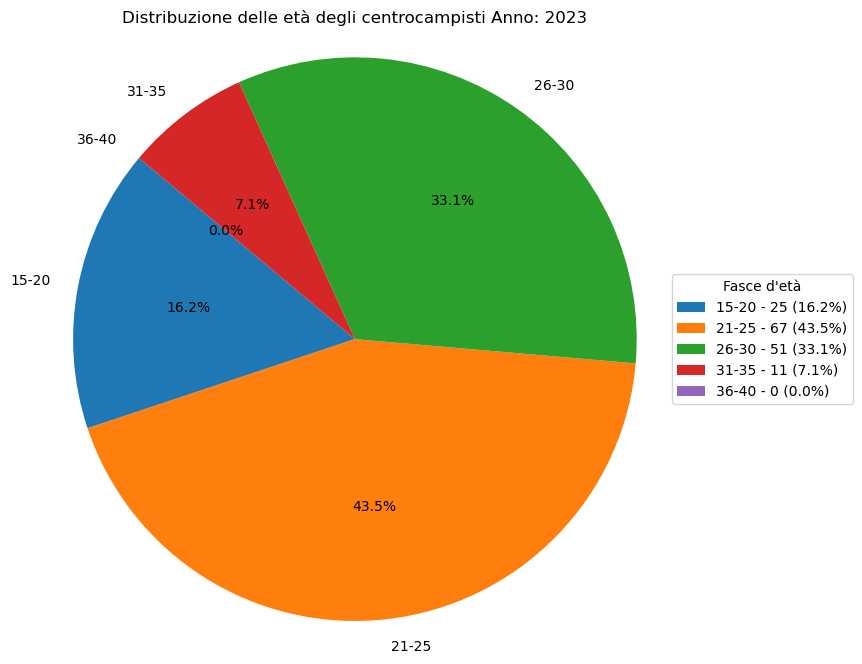

La media dell'età per l'anno 2023 è: 24.67


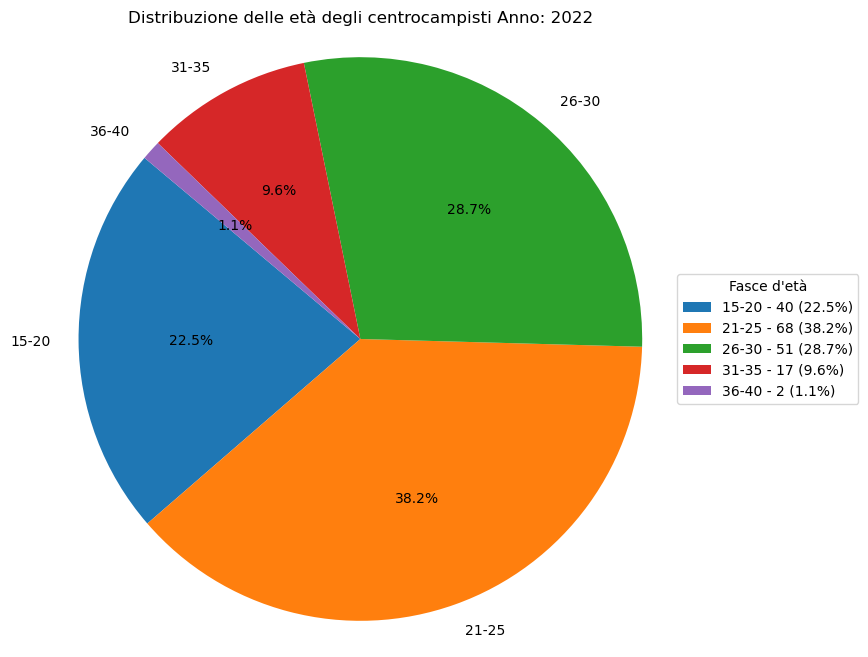

La media dell'età per l'anno 2022 è: 24.58


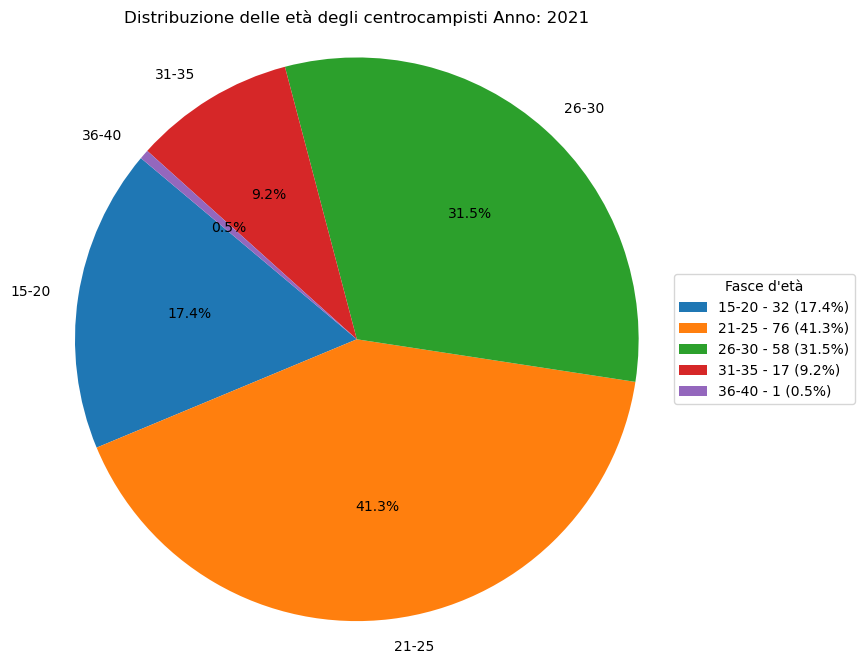

La media dell'età per l'anno 2021 è: 24.78


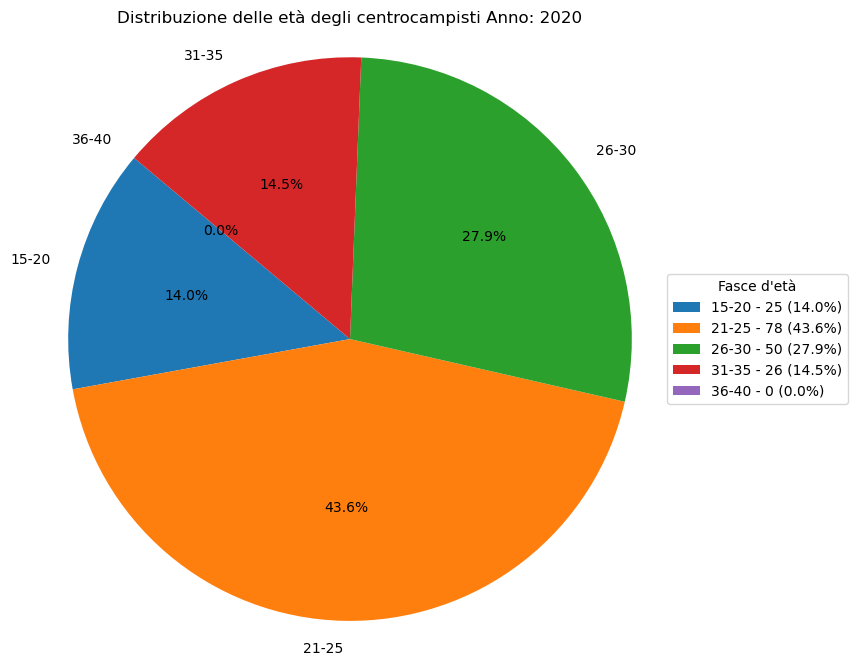

La media dell'età per l'anno 2020 è: 25.12


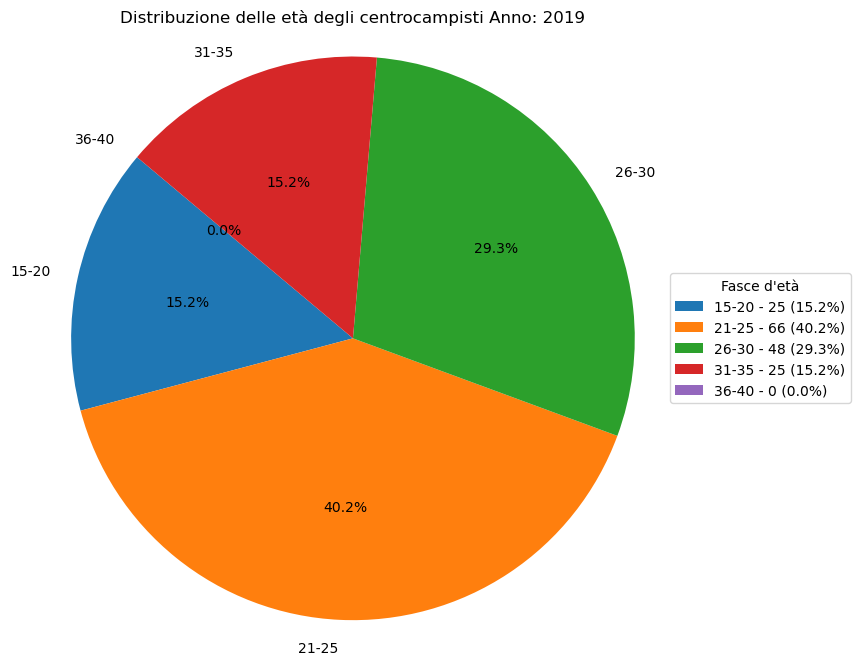

La media dell'età per l'anno 2019 è: 25.18


In [20]:
# Diagrammi a torta

# Definisci le fasce di età
bins = [15, 20, 25, 30, 35, 40]
labels = ['15-20', '21-25', '26-30', '31-35', '36-40']

# Ciclo sui file per generare i grafici
for file in files:
    # Leggi i dati da ogni file (si presuppone che ci sia una colonna 'Age')
    data = pd.read_excel(file)
    eta = data['Age']

    # Categorizza le età nelle fasce specificate
    eta_bins = pd.cut(eta, bins=bins, labels=labels, right=True, include_lowest=True)

    # Conta il numero di attaccanti in ciascuna fascia
    eta_counts = eta_bins.value_counts().sort_index()

    # Crea una figura e un oggetto ax
    fig, ax = plt.subplots(figsize=(8, 8))

    # Crea il diagramma a torta sull'oggetto ax
    ax.pie(eta_counts, labels=eta_counts.index, autopct='%1.1f%%', startangle=140)

    # Imposta il titolo per ogni anno
    ax.set_title(f"Distribuzione delle età degli centrocampisti Anno: {year[file]}")

    # Assicura che il grafico sia circolare
    ax.axis('equal')

    # Aggiungi la legenda con i valori percentuali
    ax.legend([f"{label} - {int(count)} ({pct:.1f}%)" for label, count, 
               pct in zip(eta_counts.index, eta_counts, 100*eta_counts/eta_counts.sum())],
              title="Fasce d'età", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Mostra il diagramma a torta
    plt.show()
    
    # Calcola e stampa la media dell'età
    media_eta = eta.mean()
    print(f"La media dell'età per l'anno {year[file]} è: {media_eta:.2f}")

Dai grafici possiamo notare che la media delle età è andata calando con gli anni, evidentemente l'idea delle squadre è quello di comprare attaccanti più giovani oppure investire nel reparto giovanile, migliorare il vivaio e promuovere gli attaccanti direttamente dalla Primavera (squadra U19).

Passiamo ora all'analisi delle nazionalità. Vediamo quali sono le nazionalità più presenti in Serie A.

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Unknown extension is not supported and will be removed
  for idx, row in parser.parse():
C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Conditional Formatting extension is not supported and will be removed
  for idx, row in parser.parse():


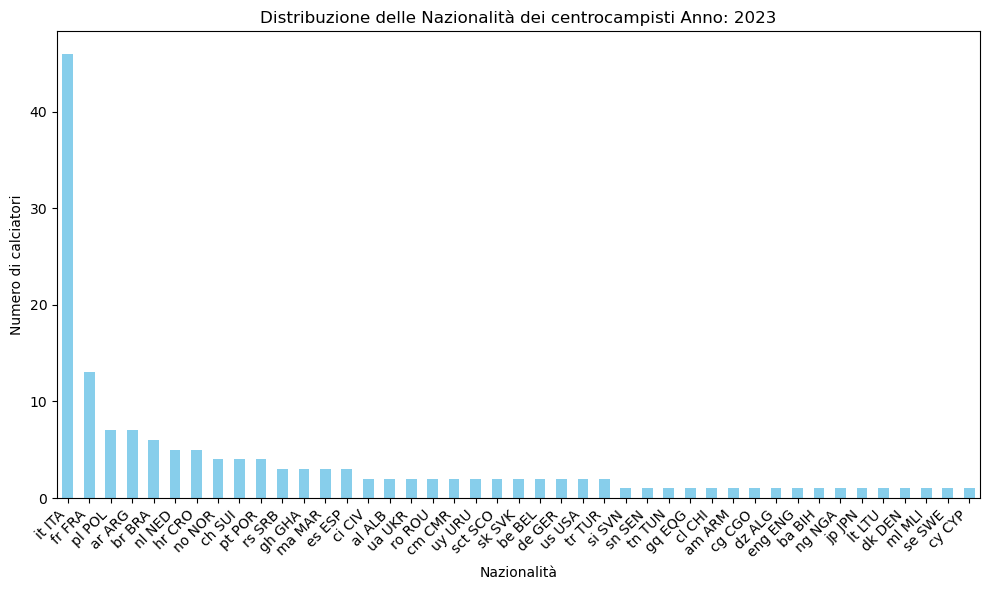

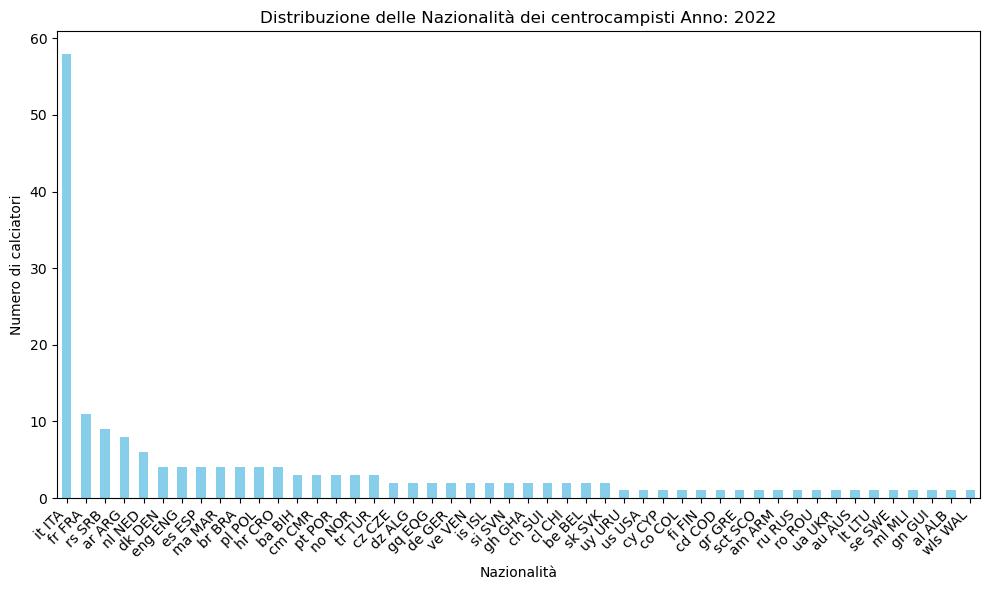

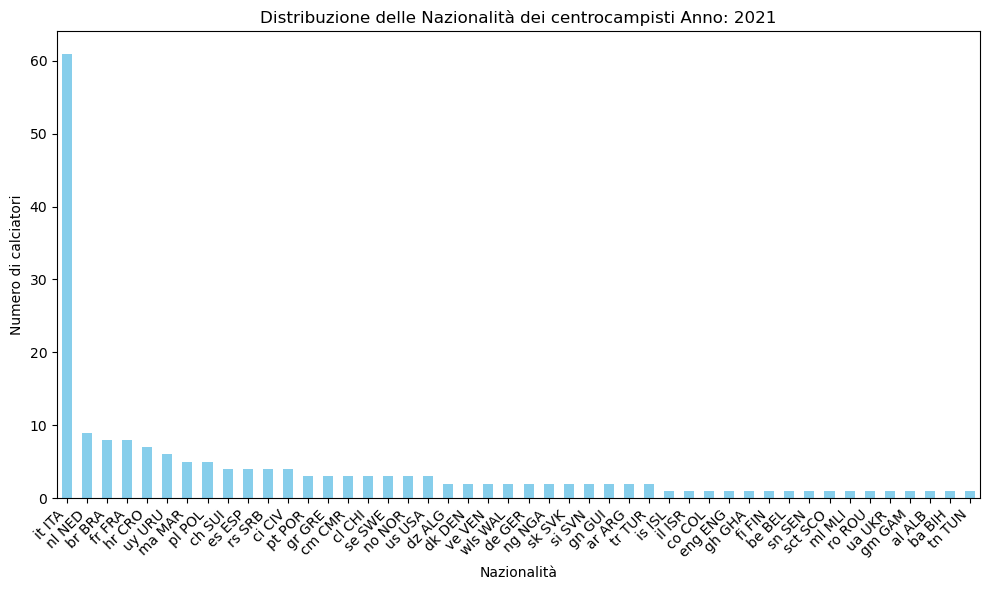

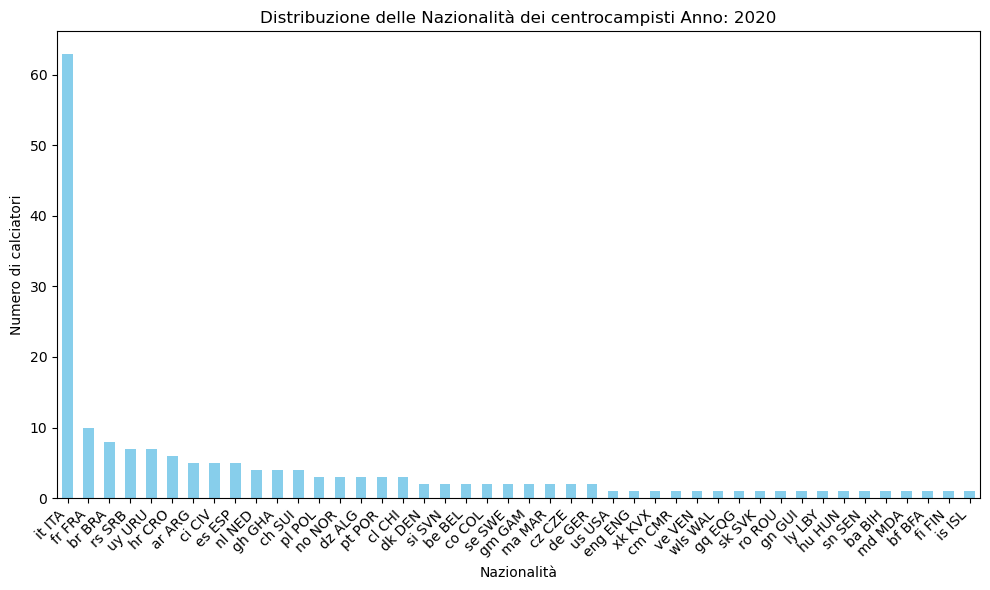

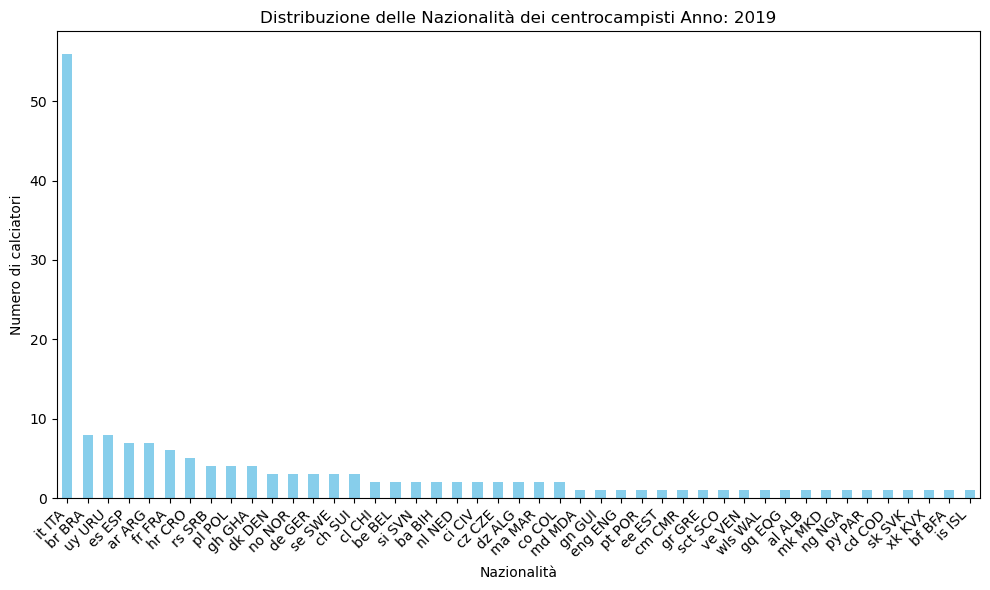

In [21]:
# Ciclo sui file per generare i grafici
for file in files:

    data = pd.read_excel(file)
     
    nazionalita = data['Nation']   #istogramma nazionalità

    # Conta il numero di calciatori per ciascuna nazionalità
    nazionalita_counts = nazionalita.value_counts()

    # Crea l'istogramma
    fig, ax = plt.subplots(figsize=(10, 6))
    nazionalita_counts.plot(kind='bar', ax=ax, color='skyblue')

    # Aggiungi i titoli e le etichette
    ax.set_title(f'Distribuzione delle Nazionalità dei centrocampisti Anno: {year[file]}')
    ax.set_xlabel('Nazionalità')
    ax.set_ylabel('Numero di calciatori')

    # Ruota le etichette sull'asse x per una migliore leggibilità
    plt.xticks(rotation=45, ha='right')

    # Mostra il grafico
    plt.tight_layout()
    plt.show()

Come ci immaginavamo la nazionale più presente, per distacco, è l'Italia. Risultano infatti circa 60 nel 2023, circa 50 nel 2022 (il minimo registrato), circa 70 nel 2021, circa 65 nel 2020 e circa 75 nel 2019 (massimo registrato). Notiamo che oltre all'Italia ci sono anche altre nazioni costantemente molto presenti durante gli anni. Nelle 3 nazioni più presenti è sempre presente l'Argentina con 10 attaccanti circa ogni anno. Se ampliamo il range a 5 notiamo anche la costante presenza di Francia e Spagna che non sono presenti nella top5 solo in un anno, rispettivamente nel 2021 e nel 2023. Fra le altre, le nazioni che meritano una menzione sono sicuramente la Costa d'Avorio presente nel 2019-2020 nella top5 ed il Brasile che solo nel 2022 esce dalla top6.

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Unknown extension is not supported and will be removed
  for idx, row in parser.parse():
C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Conditional Formatting extension is not supported and will be removed
  for idx, row in parser.parse():


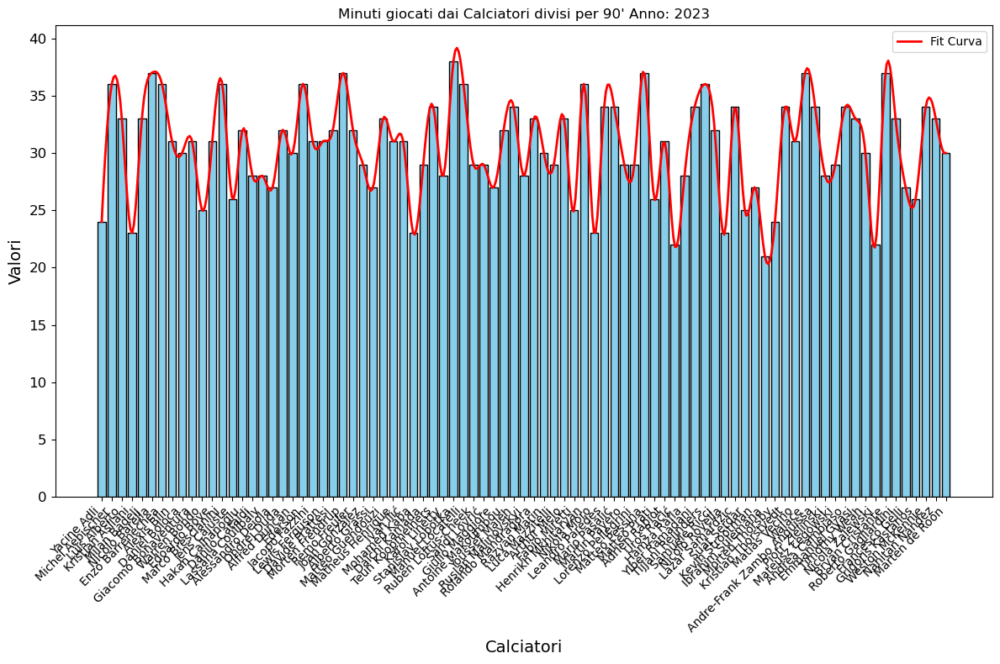

La media per l'Anno 2023 è:30.50588235294118


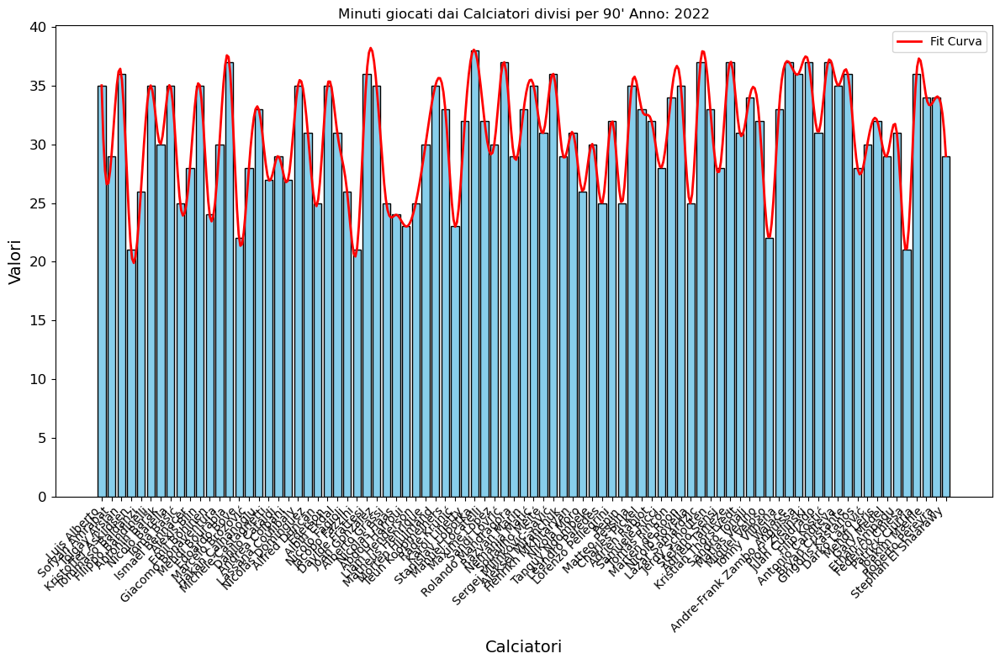

La media per l'Anno 2022 è:30.7816091954023


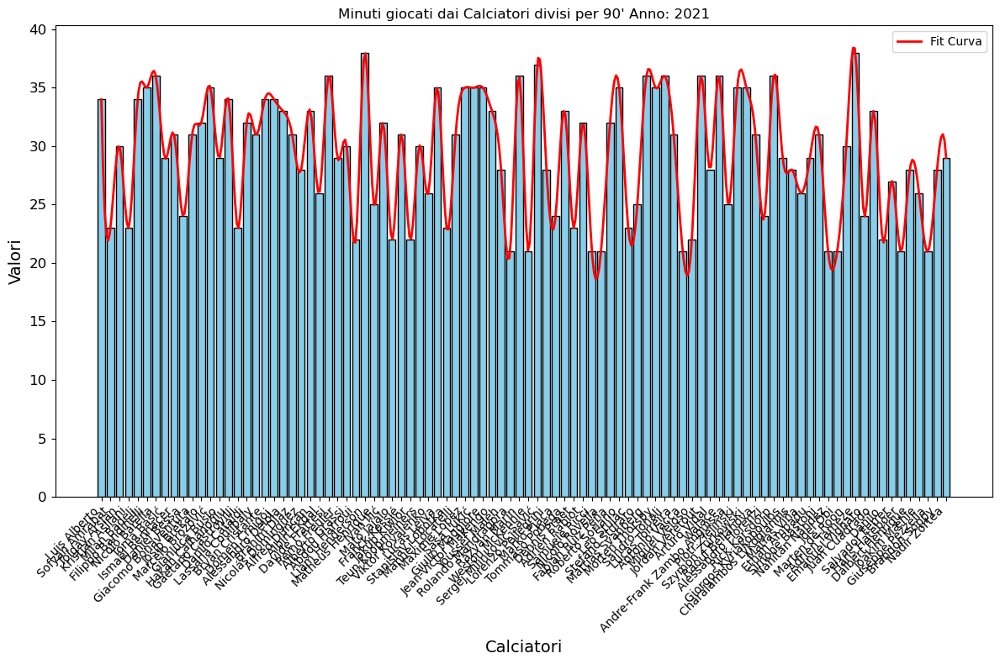

La media per l'Anno 2021 è:29.29787234042553


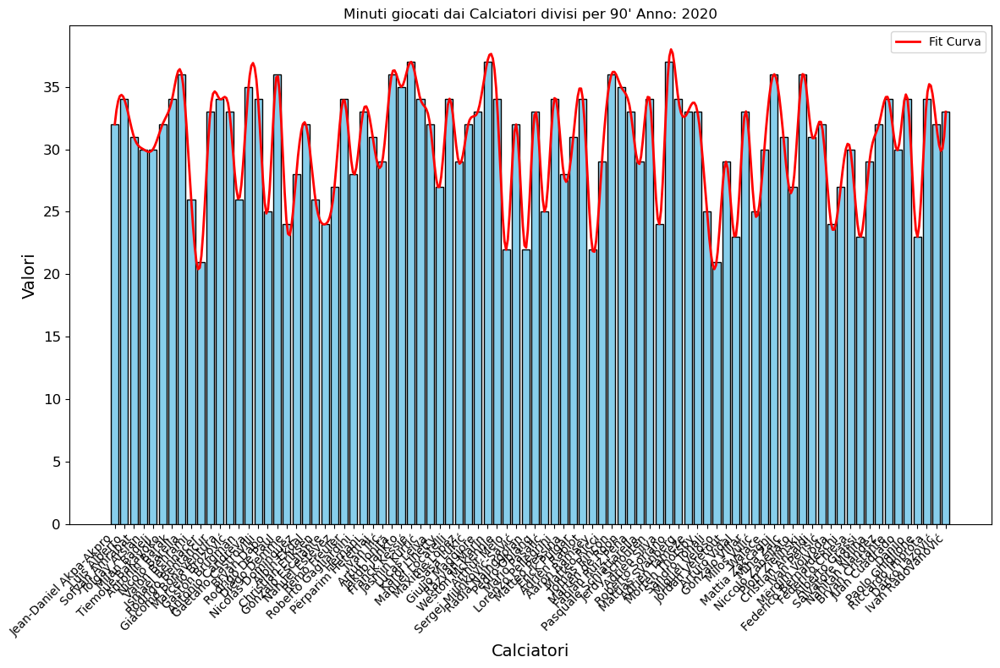

La media per l'Anno 2020 è:30.477272727272727


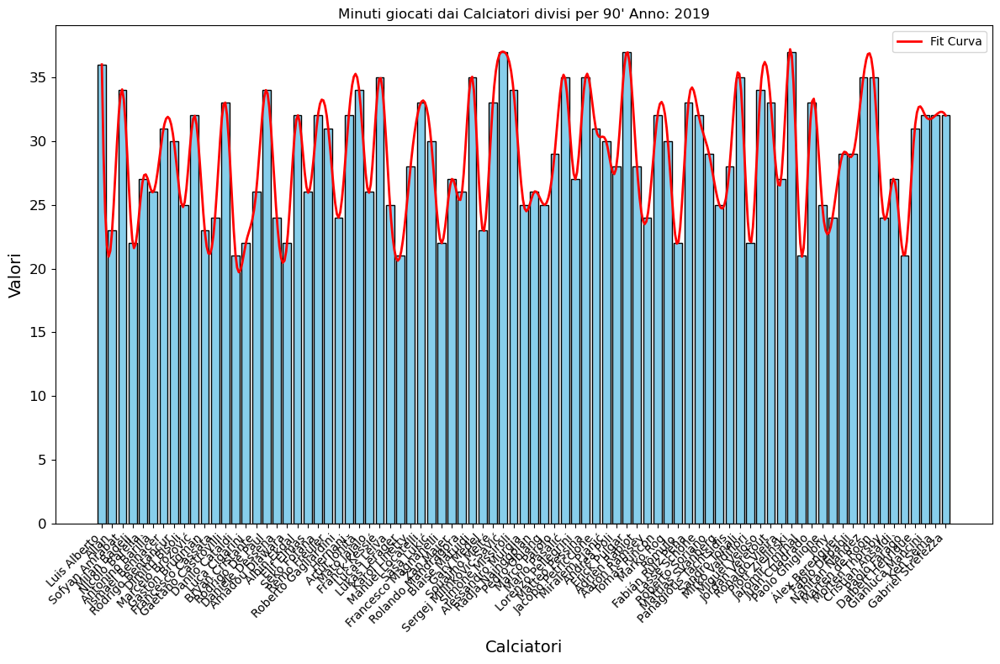

La media per l'Anno 2019 è:28.795180722891565


In [22]:
import numpy as np
from scipy.interpolate import make_interp_spline
for file in files:
 data = pd.read_excel(file)

 # Estrai i dati rilevanti (calciatori e valori nella settima colonna)
 calciatori = data['Player']  # Assume che i nomi dei calciatori siano nella prima colonna
 valori = data['MP']      # Settima colonna partendo da sinistra

 filtrato = valori > 20
 calciatori_filtrati = calciatori[filtrato]
 valori_filtrati = valori[filtrato]

 # Crea un istogramma
 plt.figure(figsize=(12, 8))
 plt.bar(calciatori_filtrati, valori_filtrati, color='skyblue', edgecolor='black')

 # Ottimizza il layout
 plt.xlabel('Calciatori', fontsize=14)
 plt.ylabel('Valori', fontsize=14)
 plt.title(f"Minuti giocati dai Calciatori divisi per 90' Anno: {year[file]}")
 plt.xticks(rotation=45, ha='right', fontsize=10)
 plt.yticks(fontsize=12)

 # Aggiungi una curva di fit
 x = np.arange(len(calciatori_filtrati))  # Converti l'indice dei calciatori filtrati in numerico
 spl = make_interp_spline(x, valori_filtrati, k=3)  # Fit con spline
 x_smooth = np.linspace(x.min(), x.max(), 500)  # Genera un range di valori lisciato
 y_smooth = spl(x_smooth)

 plt.plot(x_smooth, y_smooth, color='red', linewidth=2, label='Fit Curva')

 plt.tight_layout()
 plt.legend()
 plt.show()

 media_valori_filtrati = valori_filtrati.mean()

 # Mostra il risultato
 print(f"La media per l'Anno {year[file]} è:{media_valori_filtrati}")

In questi grafici vediamo la distribuzione dei minuti giocati diviso 90 dagli attaccanti. In altre parole calcoliamo quante partite complete vengono giocate dagli attaccanti. Abbiamo messo un bound inferiore di 20 minuti giocati per evitare che i dati vengano sfalsati da giocatori con pochi minuti giocati. Vediamo che la distribuzione e la media rimane più o meno la stessa nel corso degli anni. La media addirittura oscilla fra 29.42 e 29.98.

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Unknown extension is not supported and will be removed
  for idx, row in parser.parse():
C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Conditional Formatting extension is not supported and will be removed
  for idx, row in parser.parse():


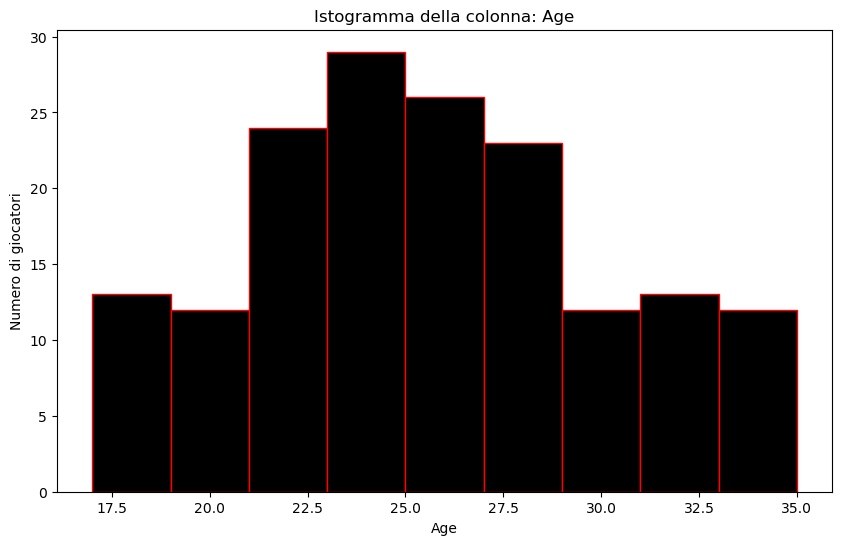

La media di Age per l'anno 2019 è: 25.18


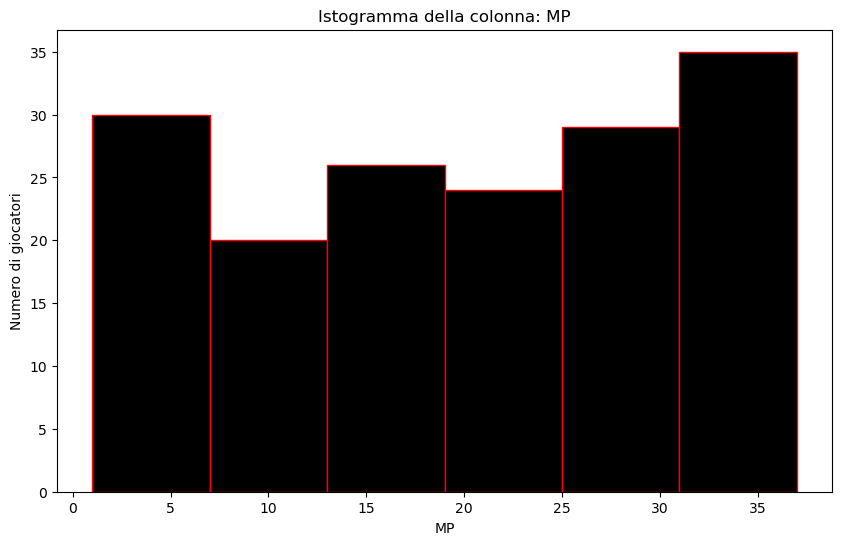

La media di MP per l'anno 2019 è: 19.16


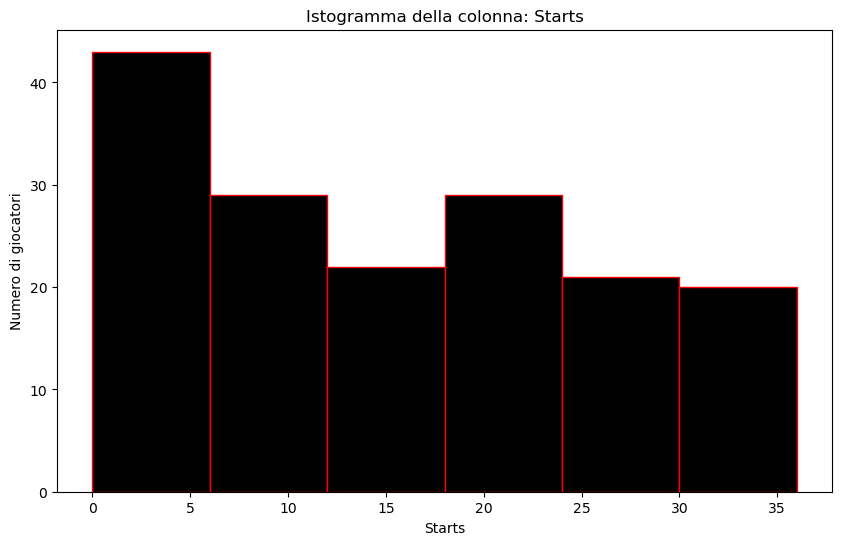

La media di Starts per l'anno 2019 è: 14.62


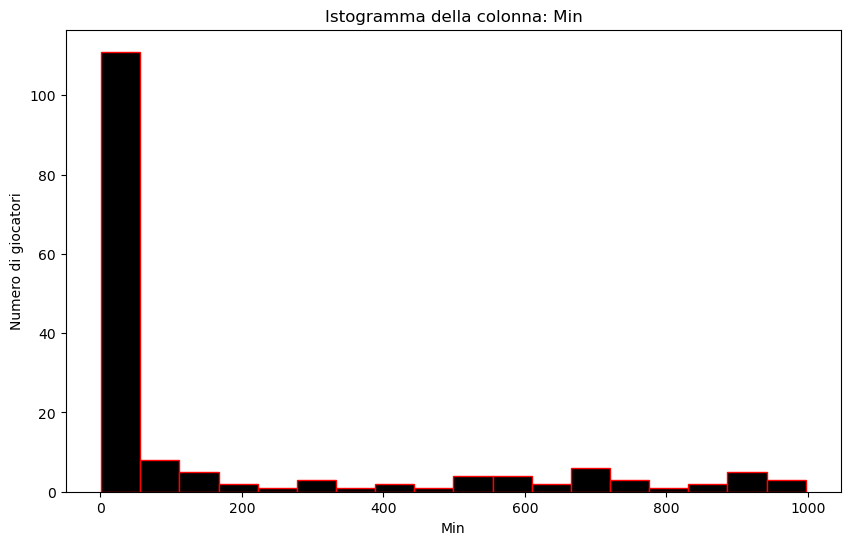

La media di Min per l'anno 2019 è: 164.96


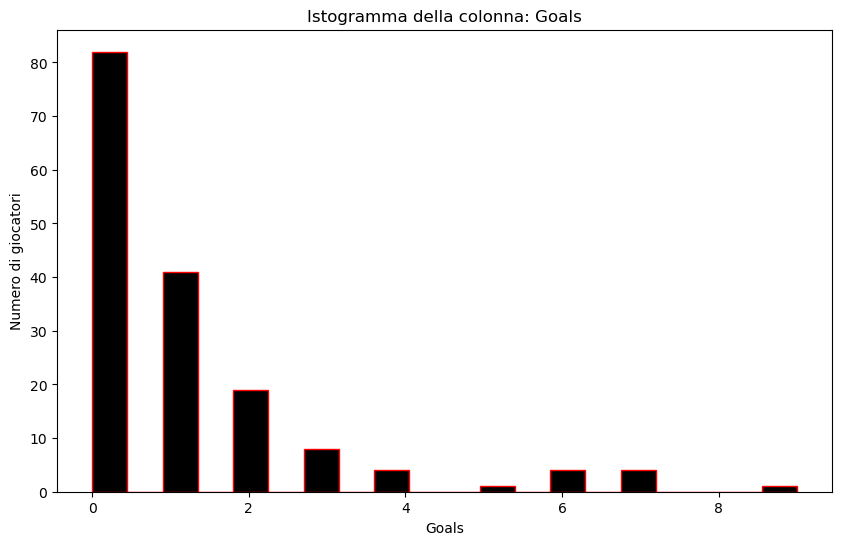

La media di Goals per l'anno 2019 è: 1.13


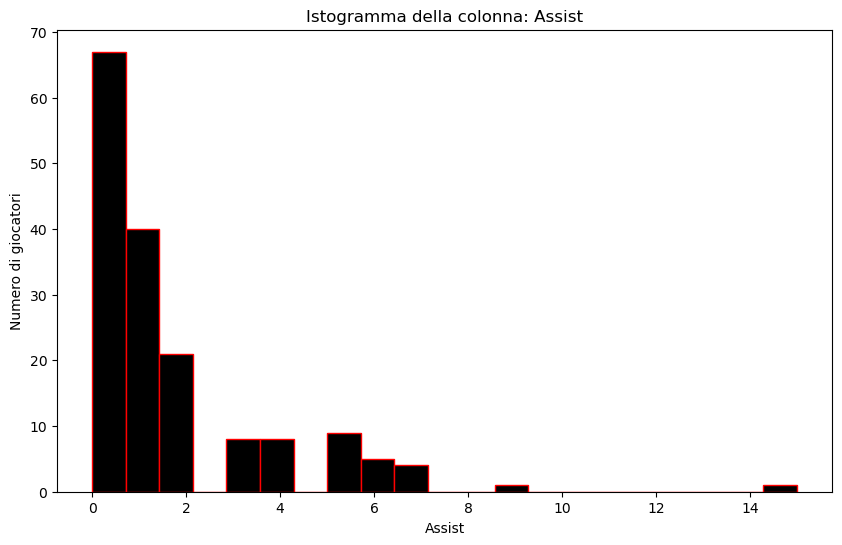

La media di Assist per l'anno 2019 è: 1.62


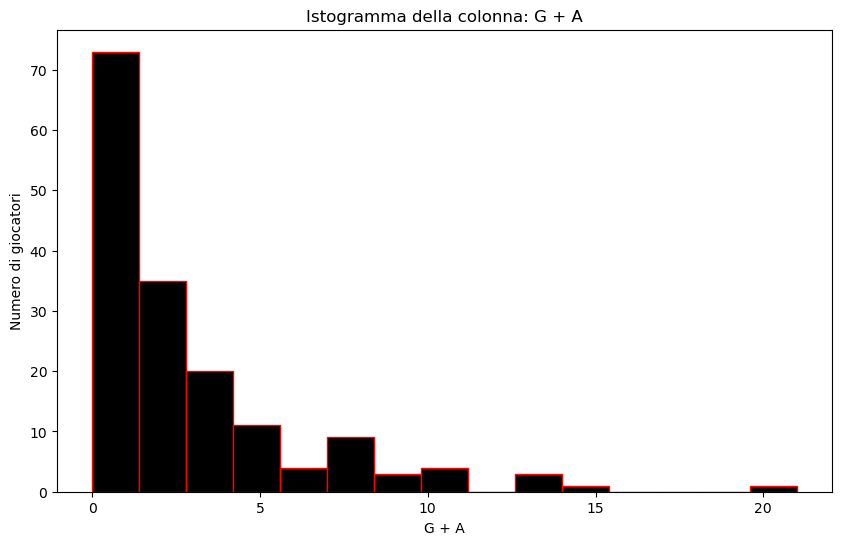

La media di G + A per l'anno 2019 è: 2.74


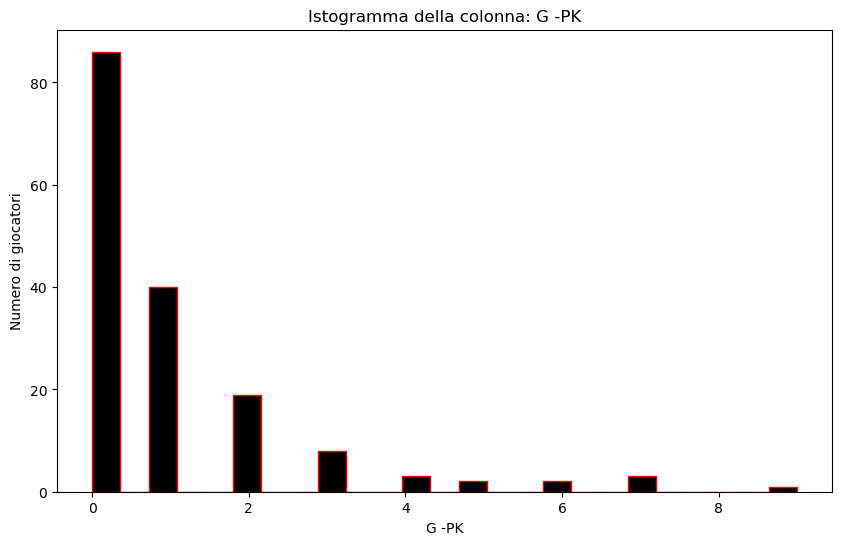

La media di G -PK per l'anno 2019 è: 1.01


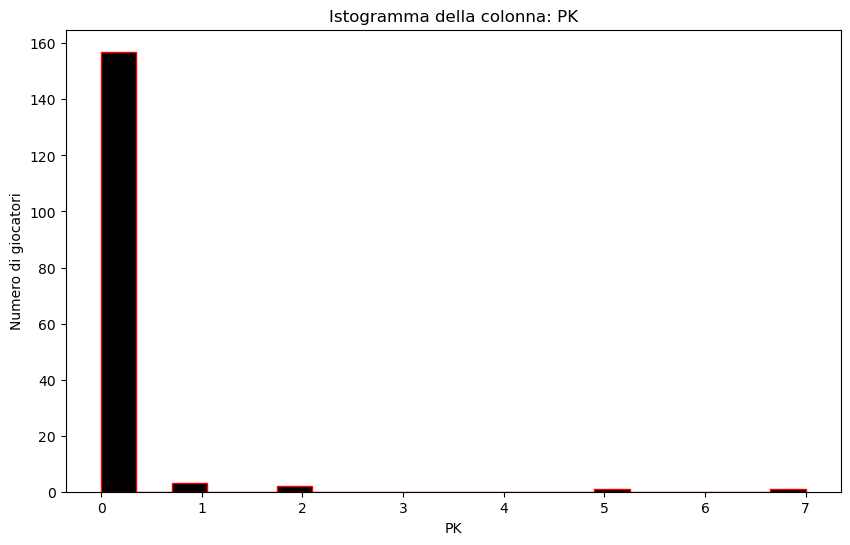

La media di PK per l'anno 2019 è: 0.12


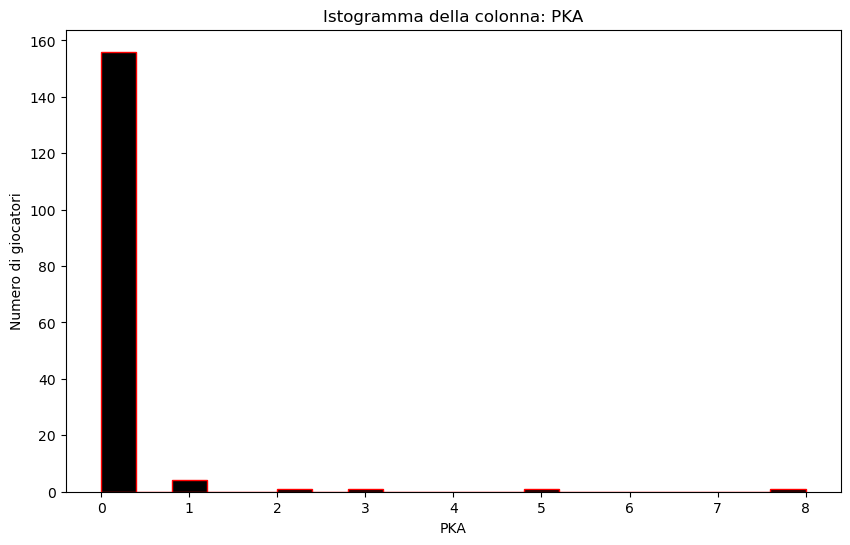

La media di PKA per l'anno 2019 è: 0.13


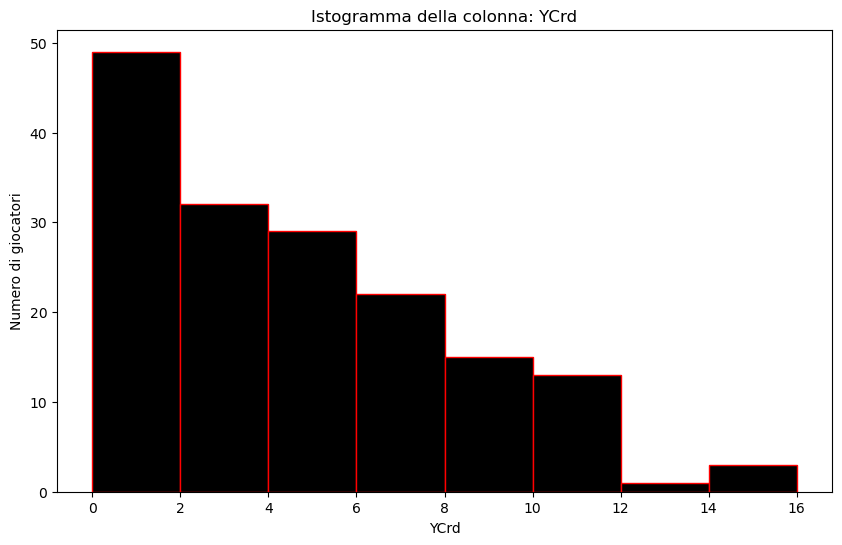

La media di YCrd per l'anno 2019 è: 4.15


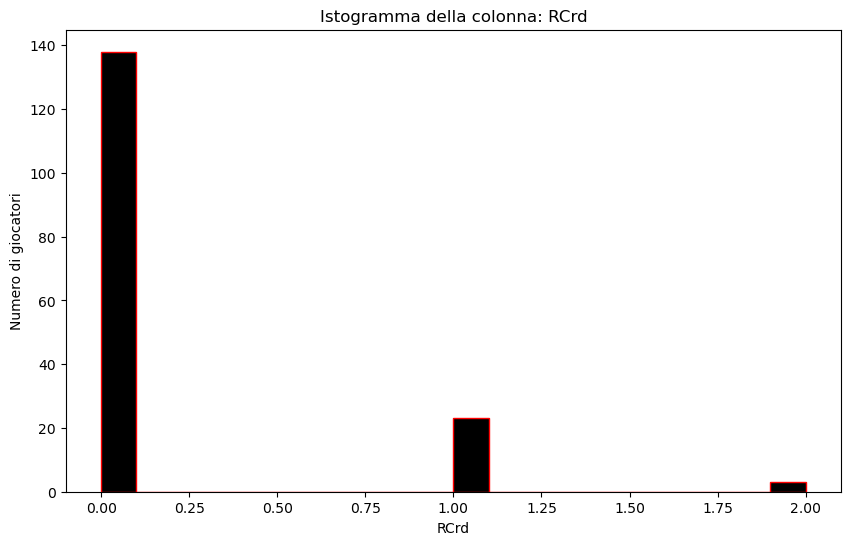

La media di RCrd per l'anno 2019 è: 0.18


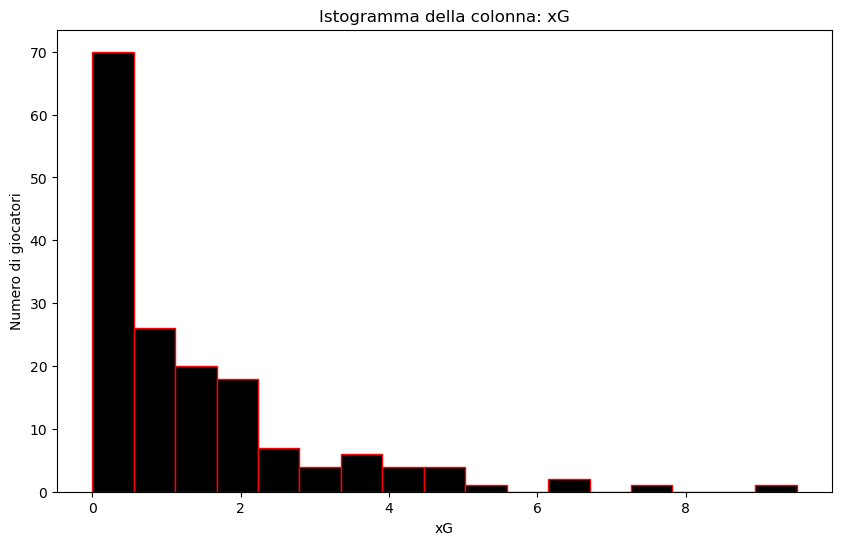

La media di xG per l'anno 2019 è: 1.34


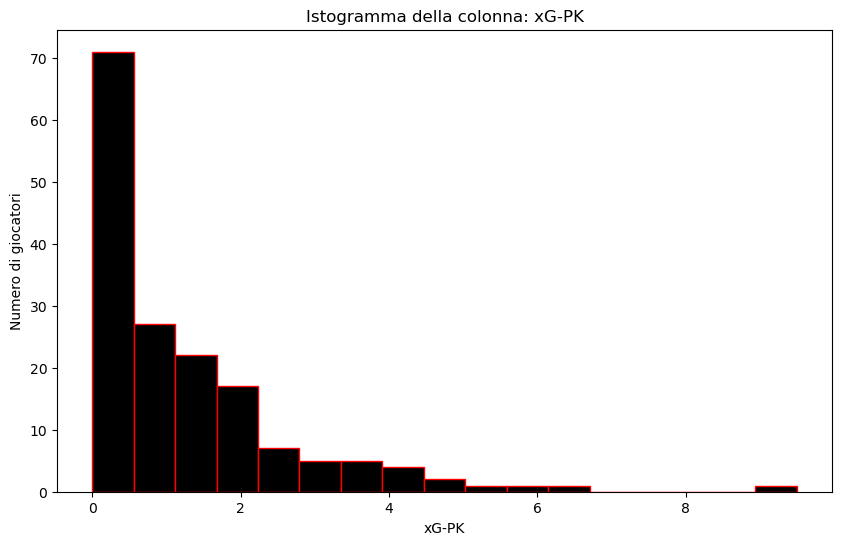

La media di xG-PK per l'anno 2019 è: 1.23


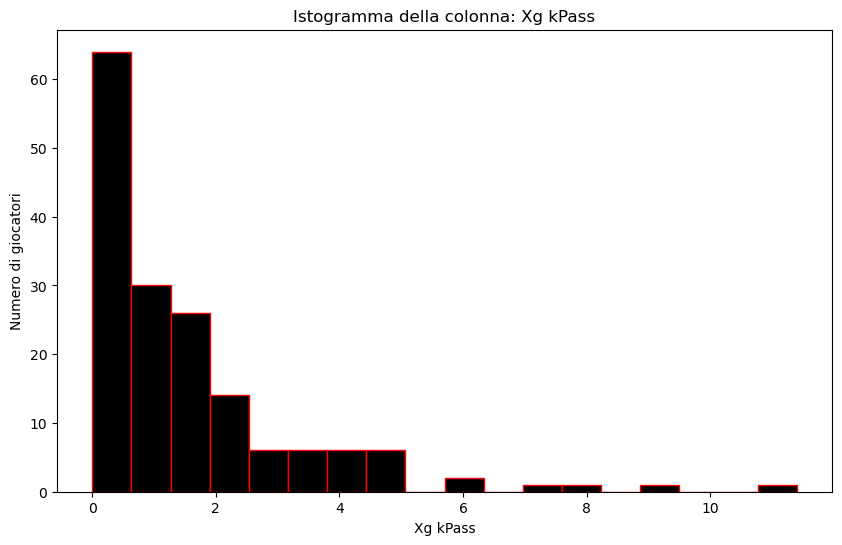

La media di Xg kPass per l'anno 2019 è: 1.53


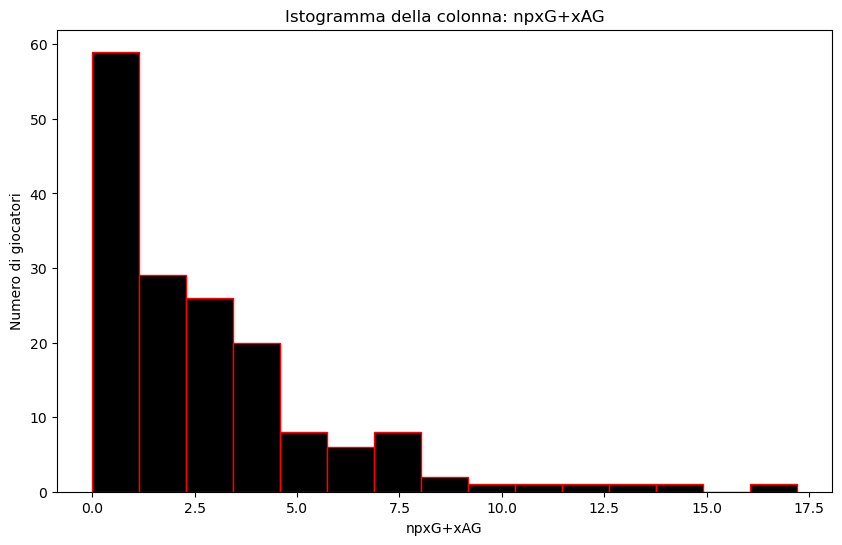

La media di npxG+xAG per l'anno 2019 è: 2.76


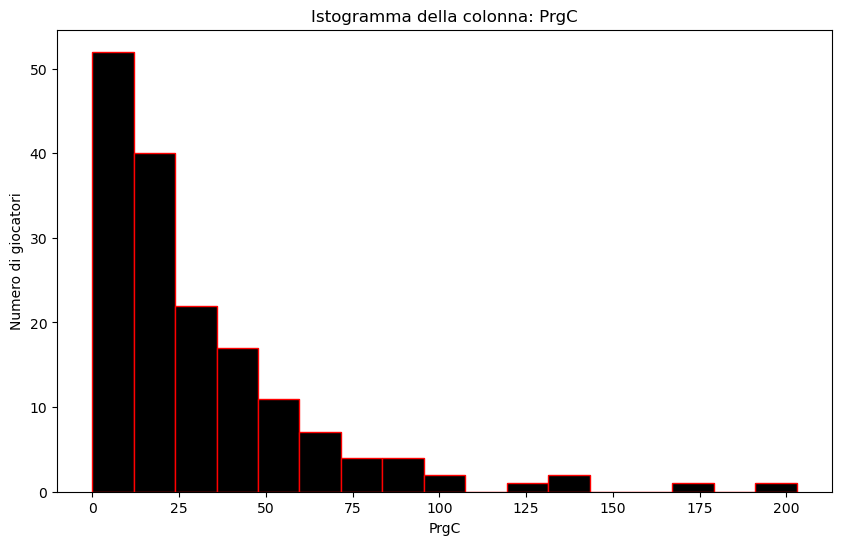

La media di PrgC per l'anno 2019 è: 29.85


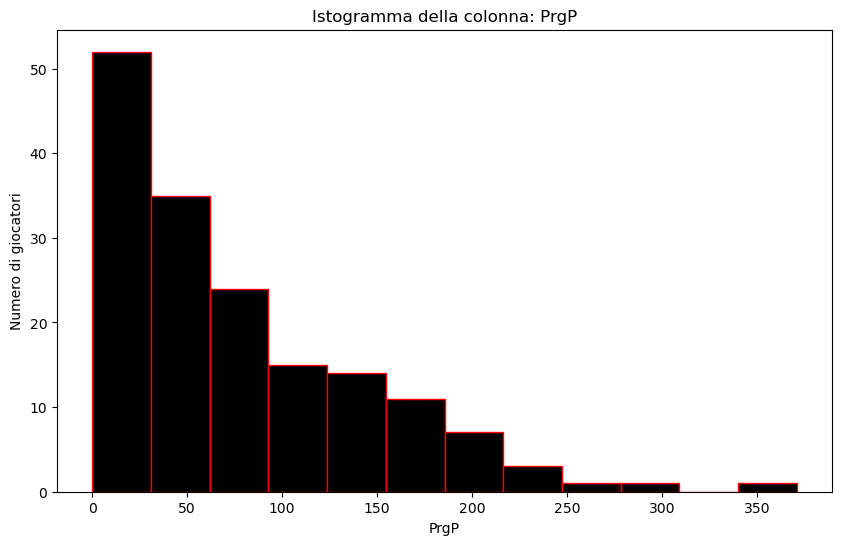

La media di PrgP per l'anno 2019 è: 75.45


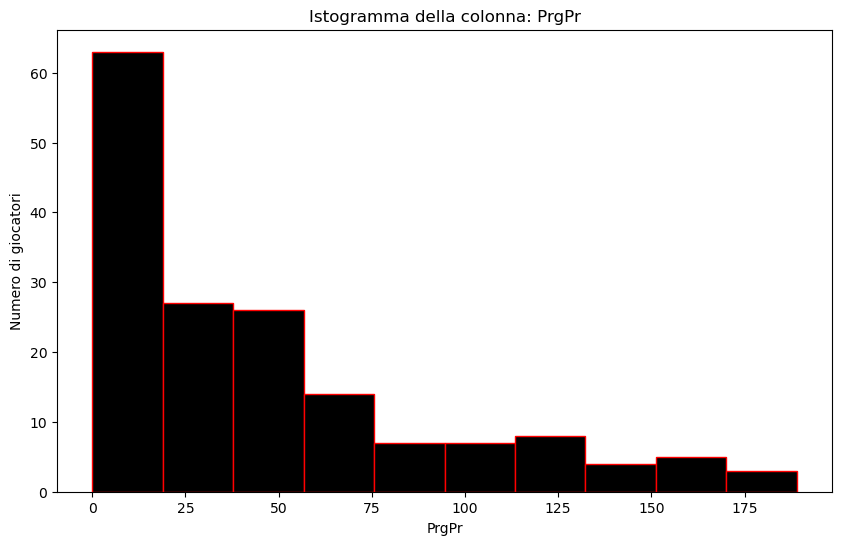

La media di PrgPr per l'anno 2019 è: 45.39


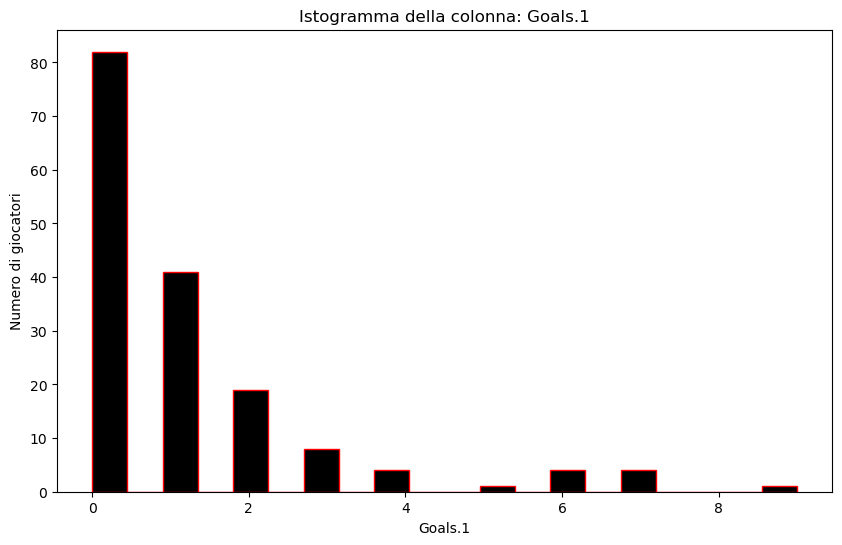

La media di Goals.1 per l'anno 2019 è: 1.13


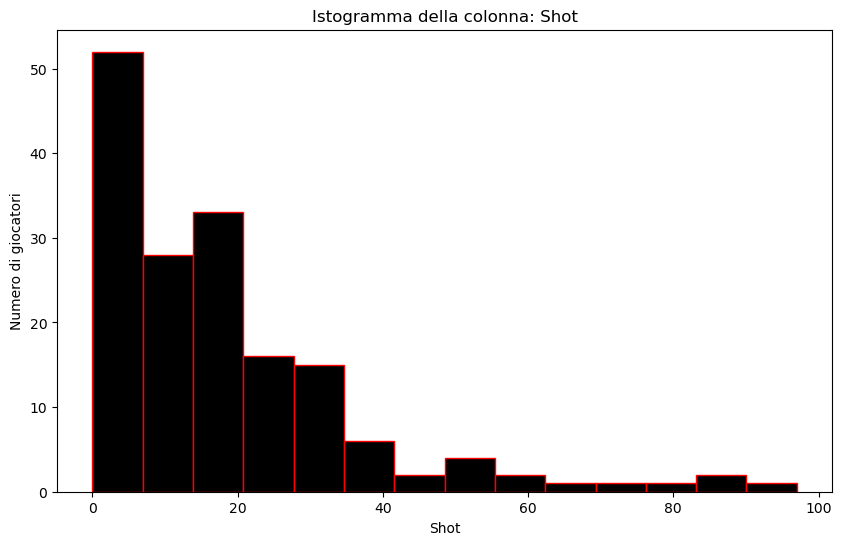

La media di Shot per l'anno 2019 è: 17.66


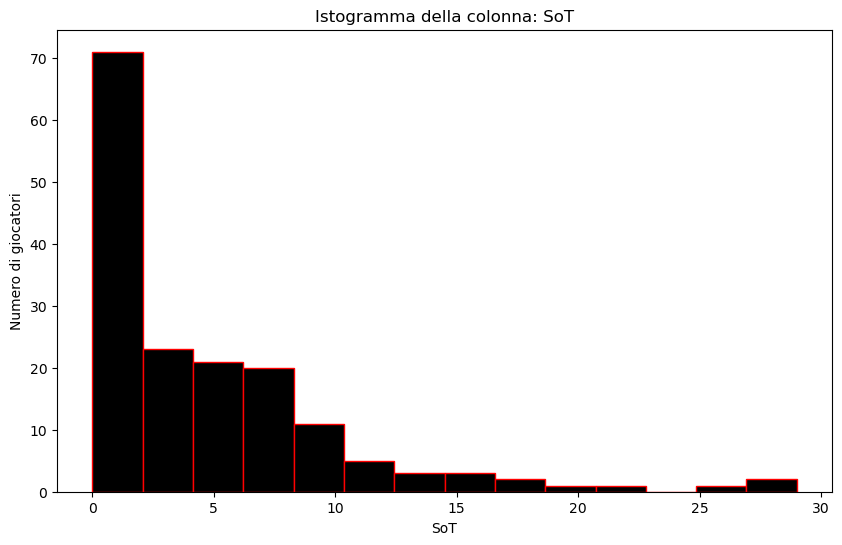

La media di SoT per l'anno 2019 è: 4.84


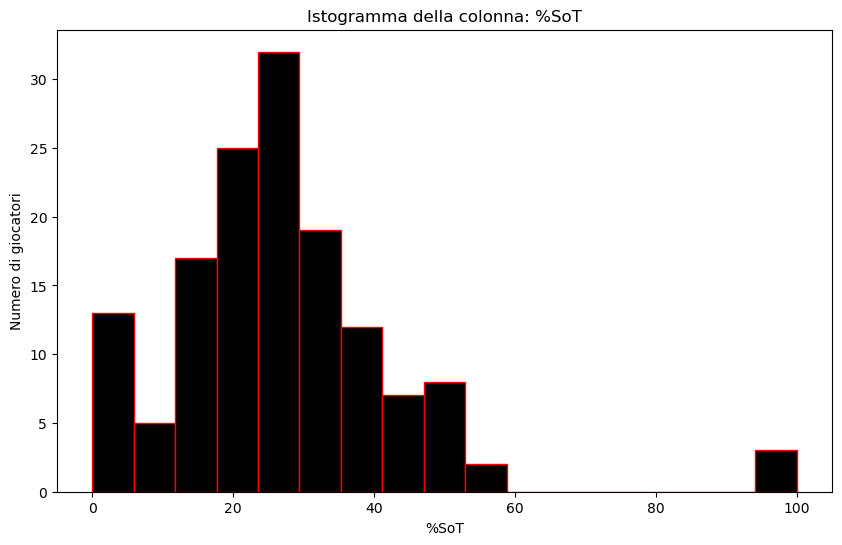

La media di %SoT per l'anno 2019 è: 27.14


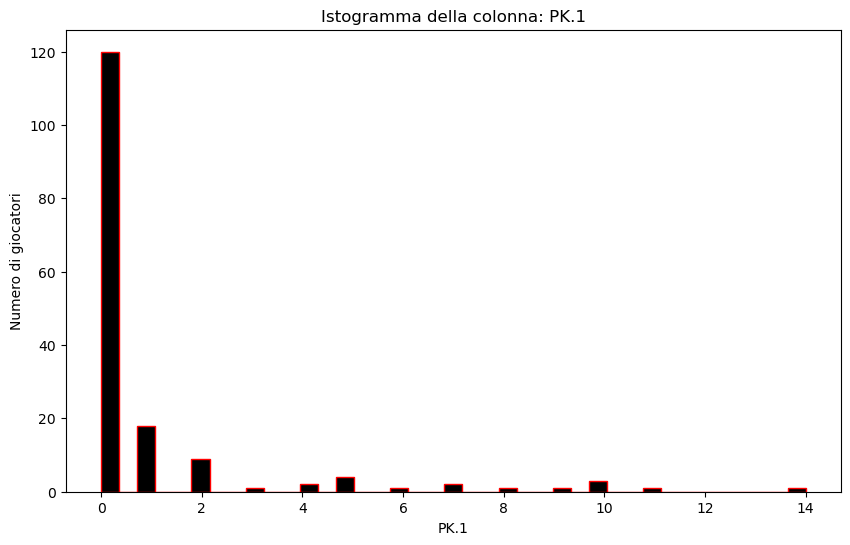

La media di PK.1 per l'anno 2019 è: 0.97


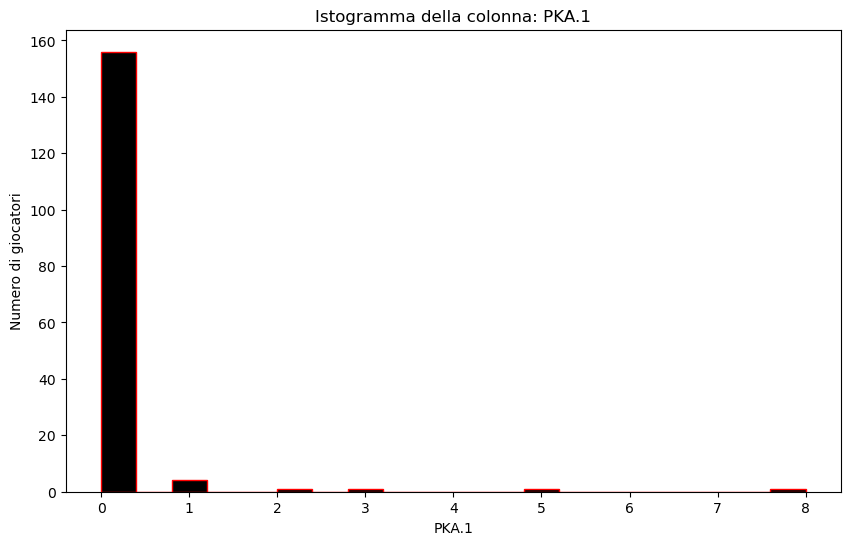

La media di PKA.1 per l'anno 2019 è: 0.13


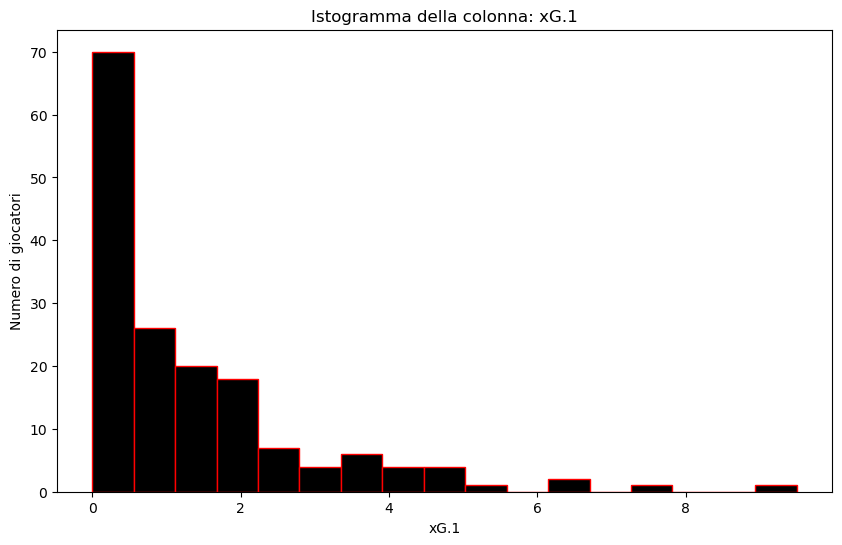

La media di xG.1 per l'anno 2019 è: 1.34


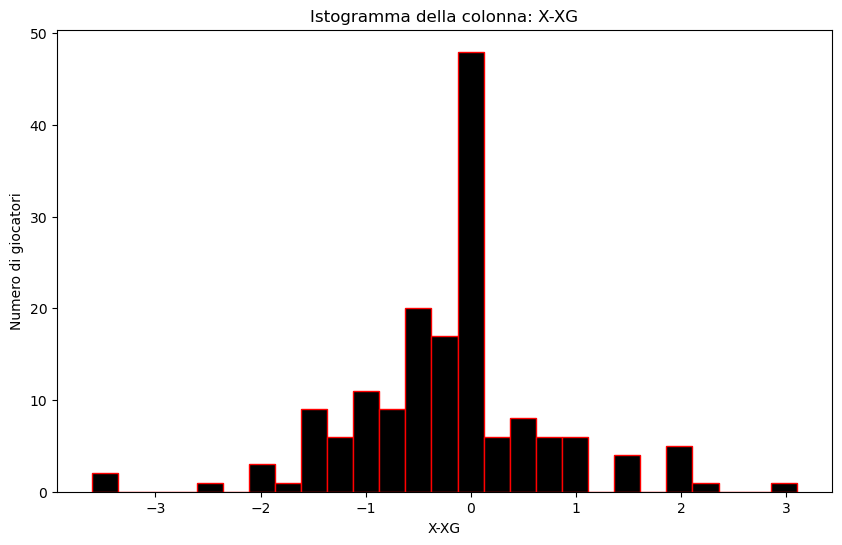

La media di X-XG per l'anno 2019 è: -0.21


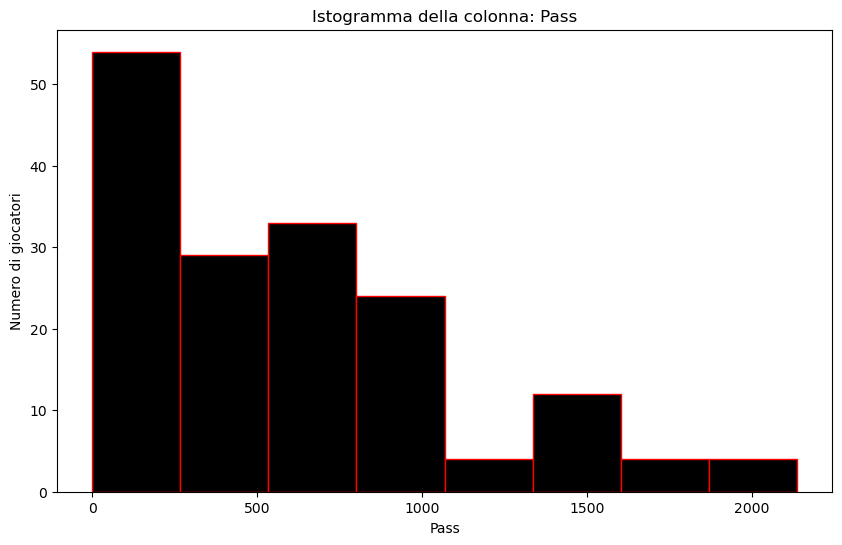

La media di Pass per l'anno 2019 è: 597.55


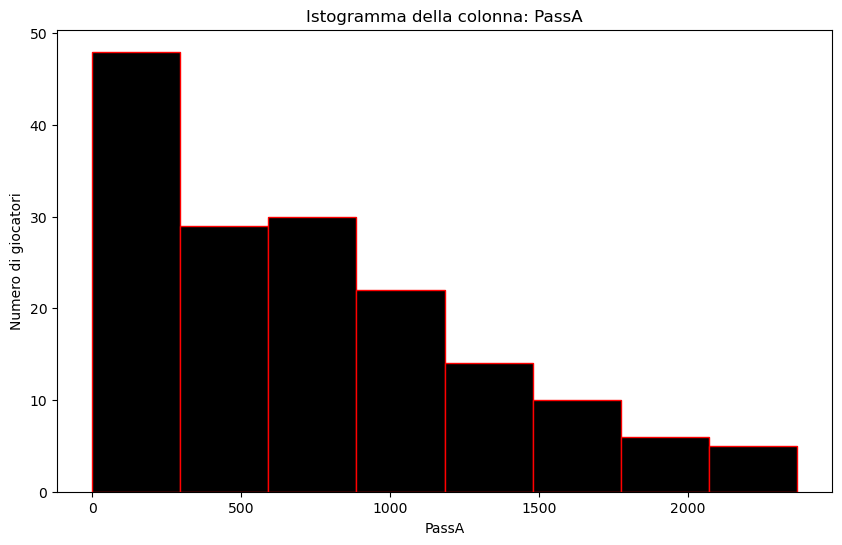

La media di PassA per l'anno 2019 è: 728.98


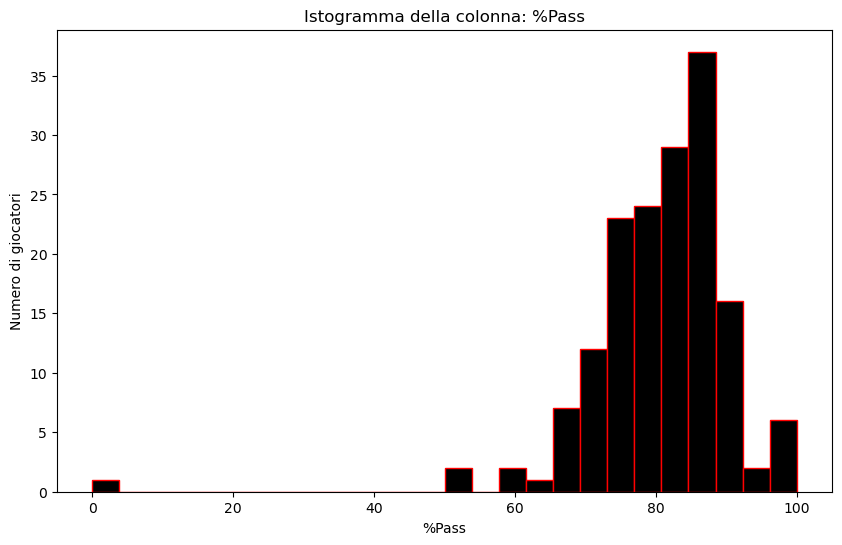

La media di %Pass per l'anno 2019 è: 80.70


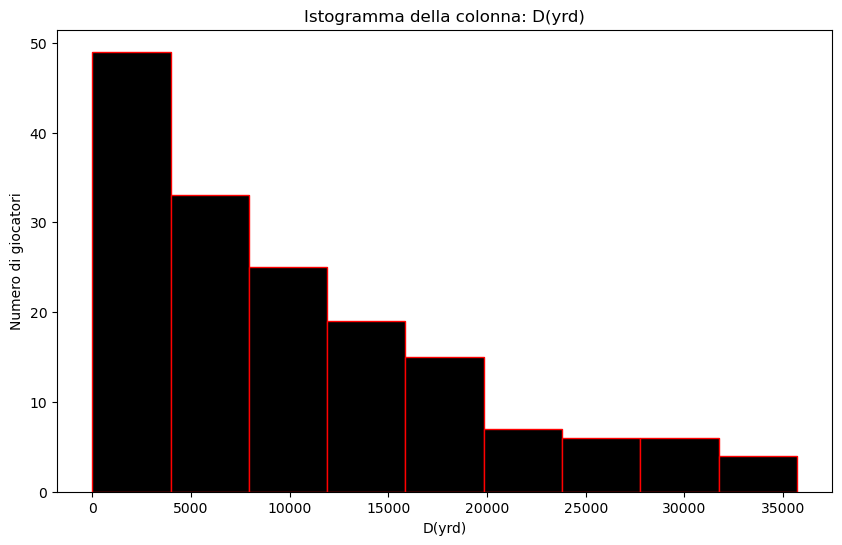

La media di D(yrd) per l'anno 2019 è: 10044.63


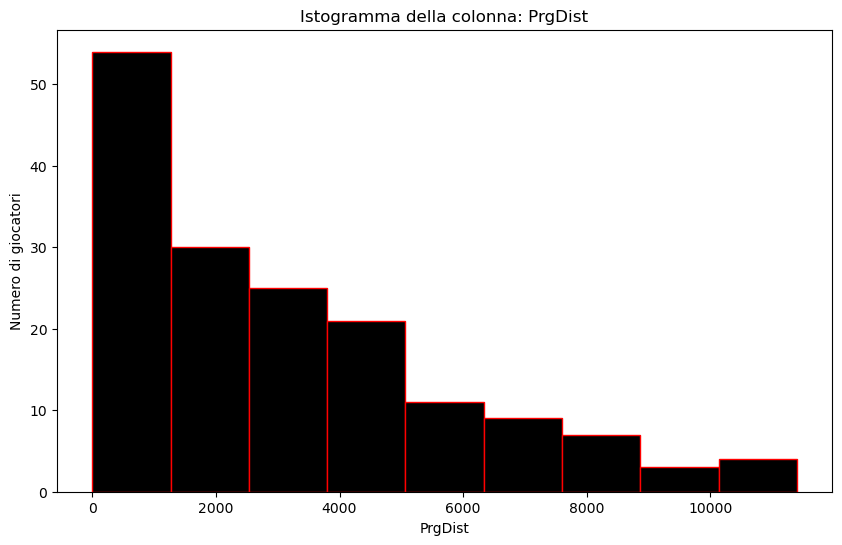

La media di PrgDist per l'anno 2019 è: 3041.93


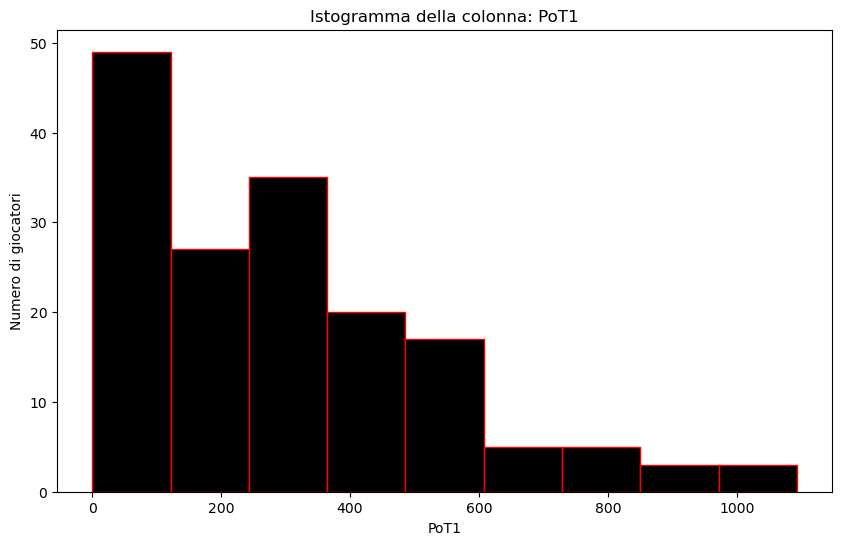

La media di PoT1 per l'anno 2019 è: 291.83


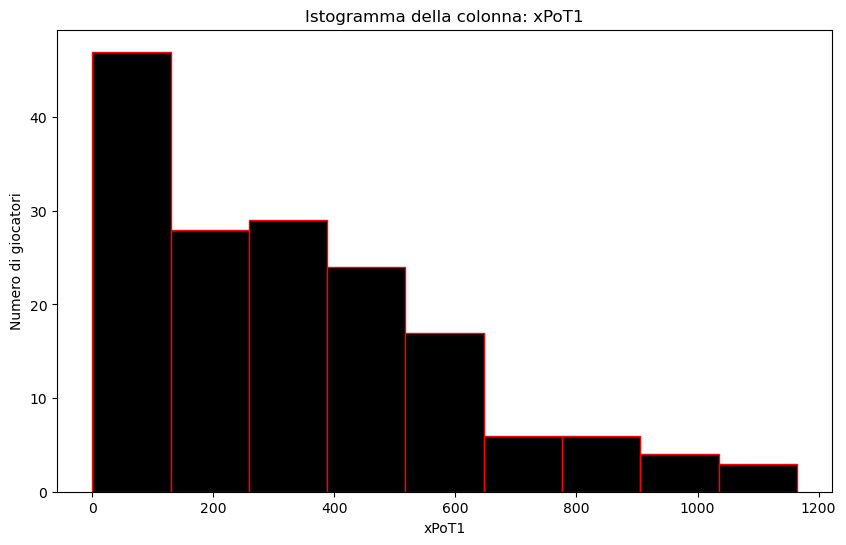

La media di xPoT1 per l'anno 2019 è: 325.12


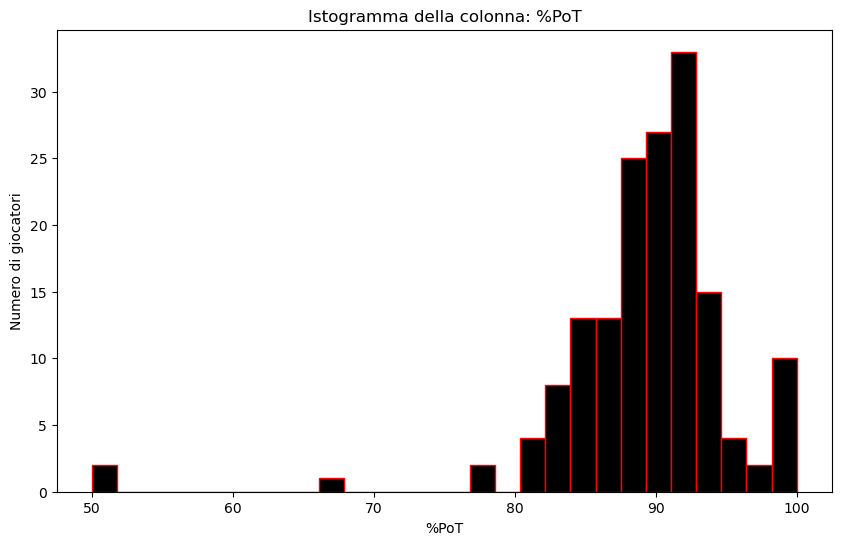

La media di %PoT per l'anno 2019 è: 89.24


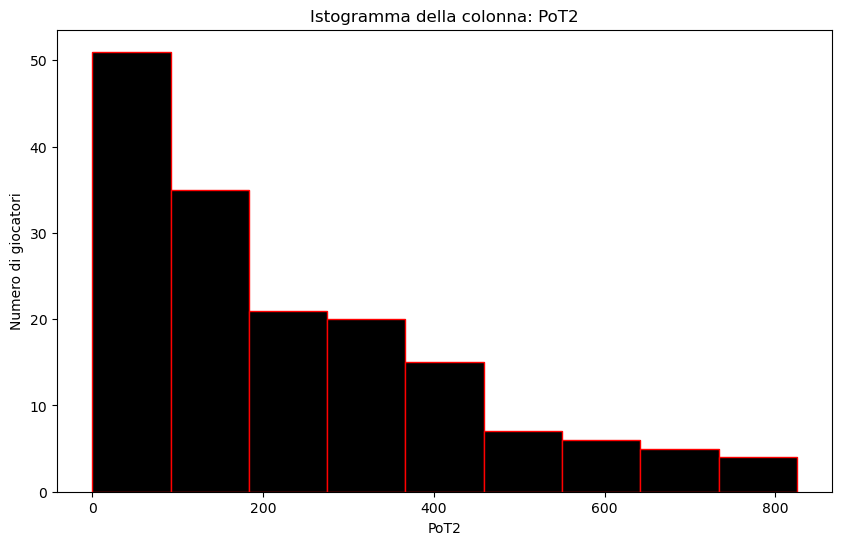

La media di PoT2 per l'anno 2019 è: 227.15


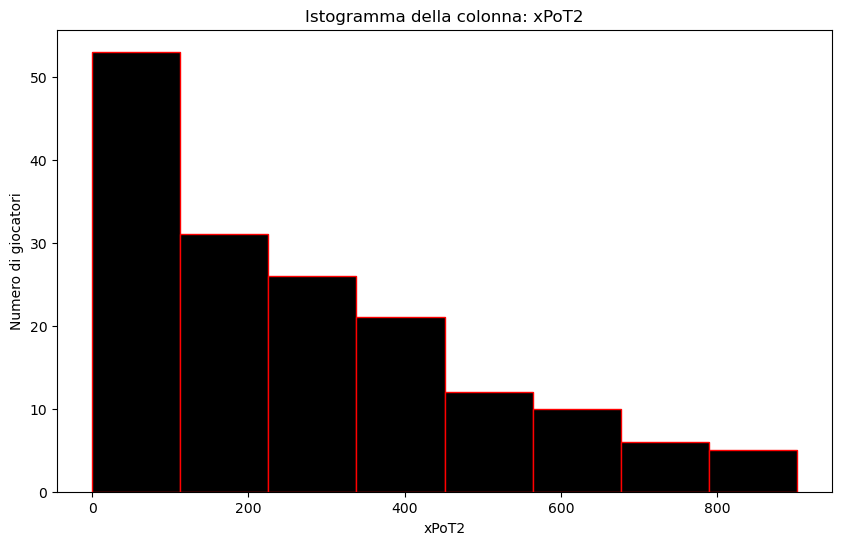

La media di xPoT2 per l'anno 2019 è: 264.99


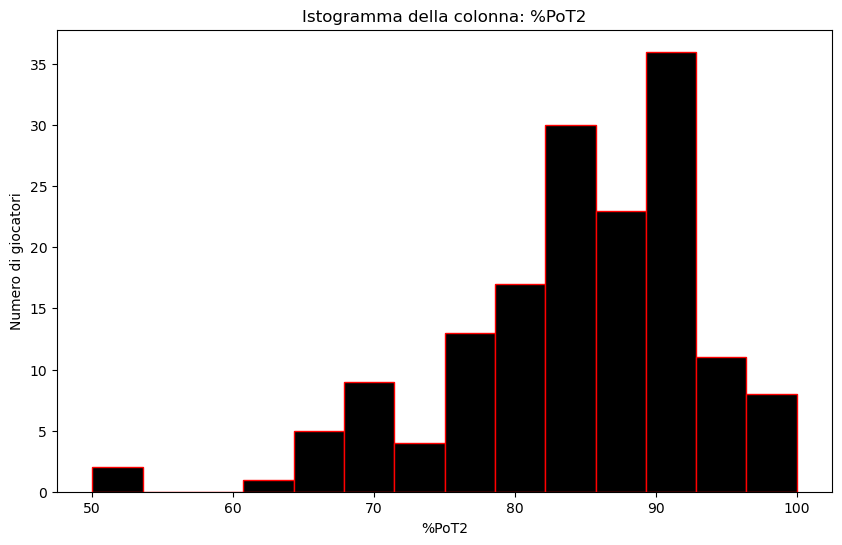

La media di %PoT2 per l'anno 2019 è: 84.52


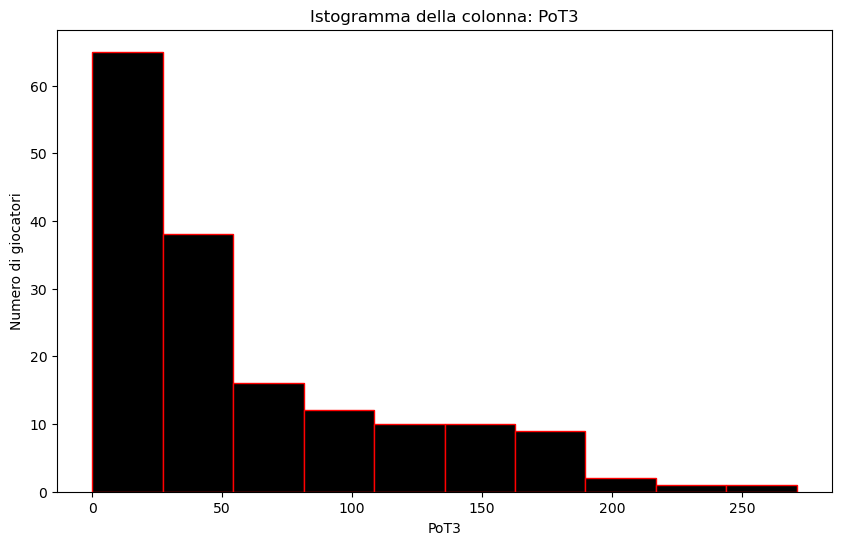

La media di PoT3 per l'anno 2019 è: 57.89


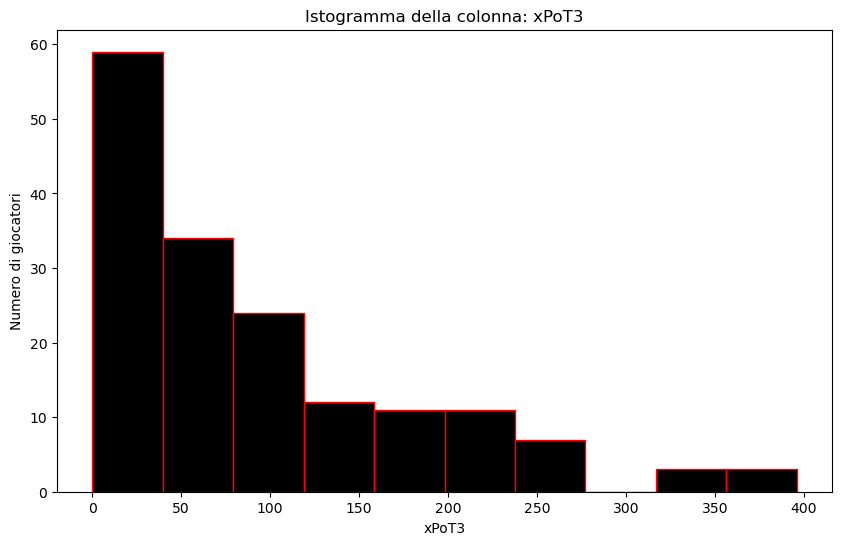

La media di xPoT3 per l'anno 2019 è: 91.92


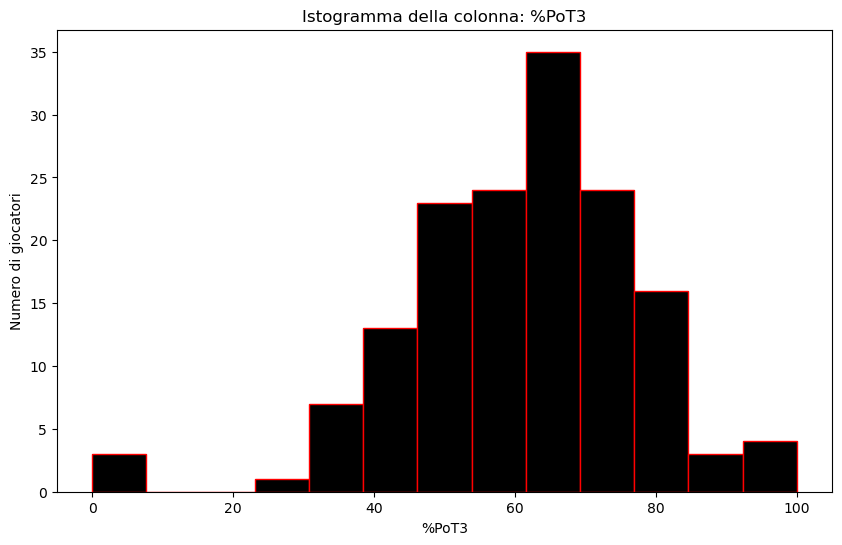

La media di %PoT3 per l'anno 2019 è: 61.31


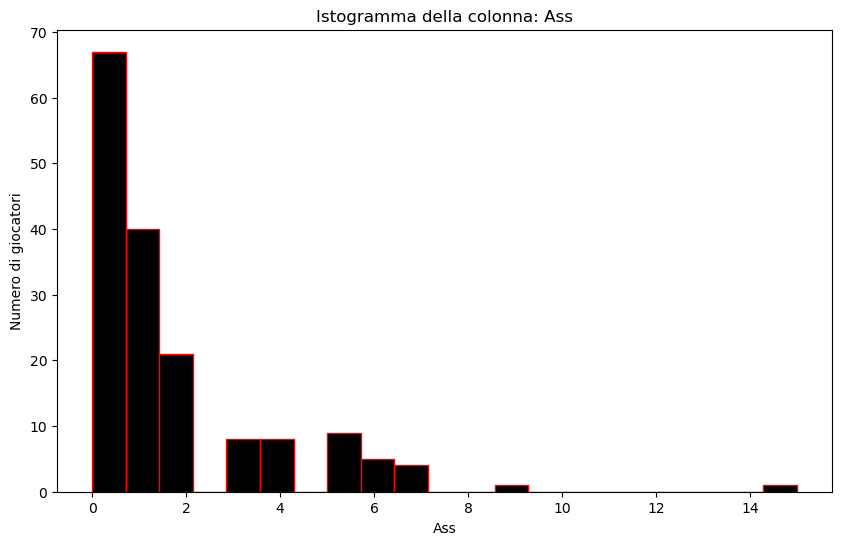

La media di Ass per l'anno 2019 è: 1.62


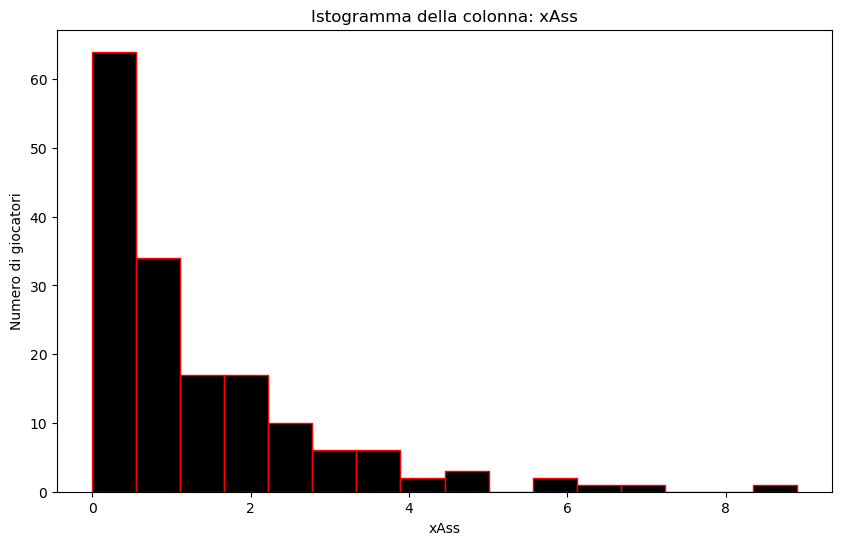

La media di xAss per l'anno 2019 è: 1.34


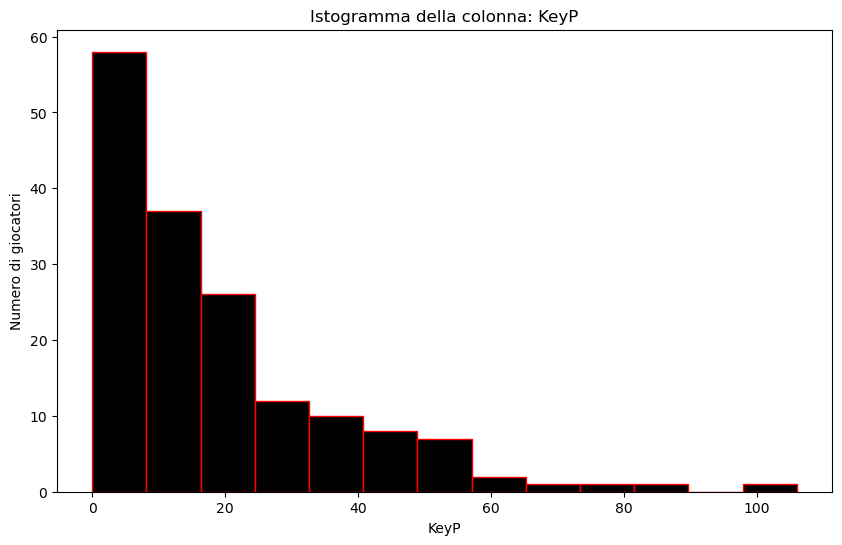

La media di KeyP per l'anno 2019 è: 18.16


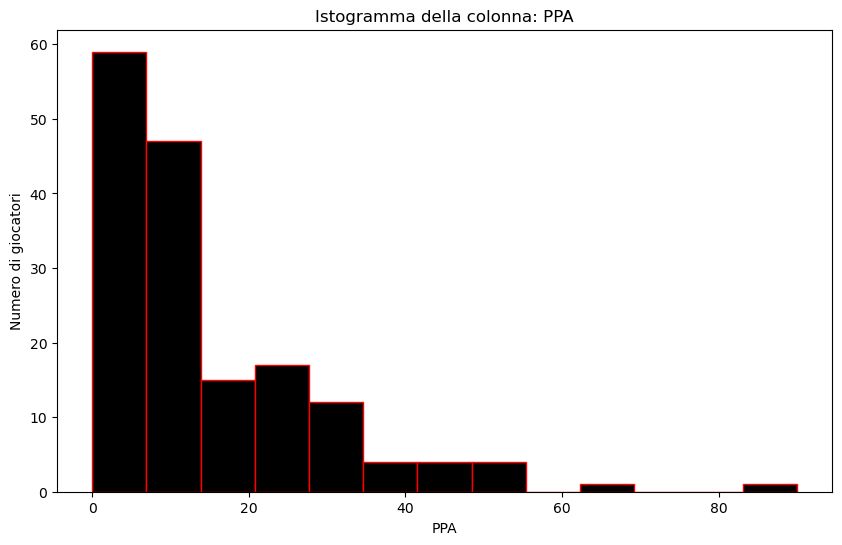

La media di PPA per l'anno 2019 è: 13.82


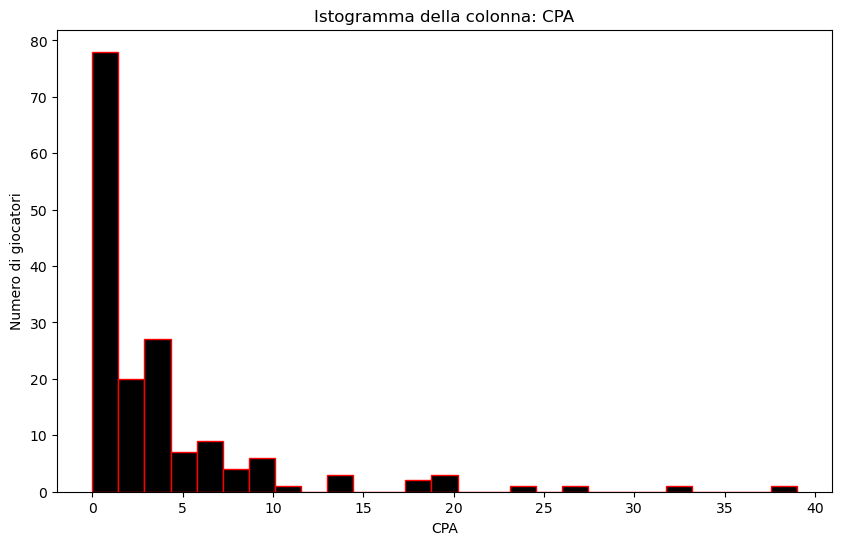

La media di CPA per l'anno 2019 è: 3.70


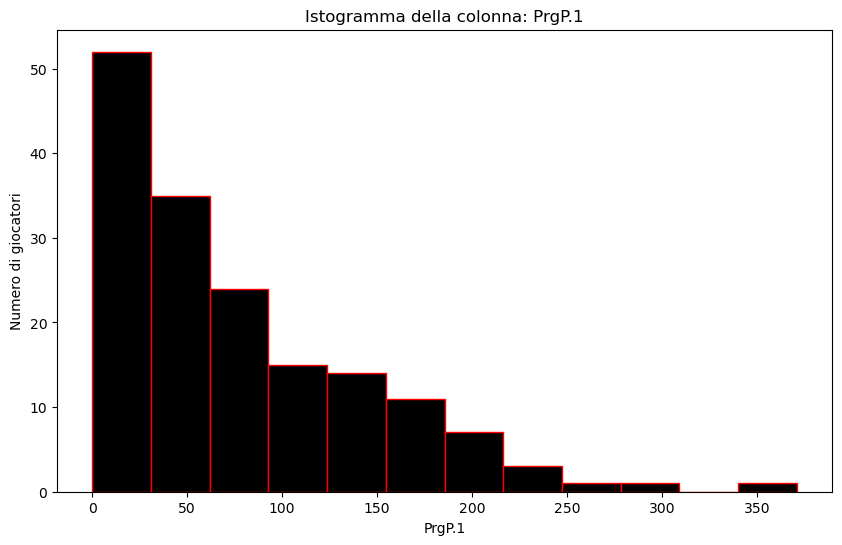

La media di PrgP.1 per l'anno 2019 è: 75.45


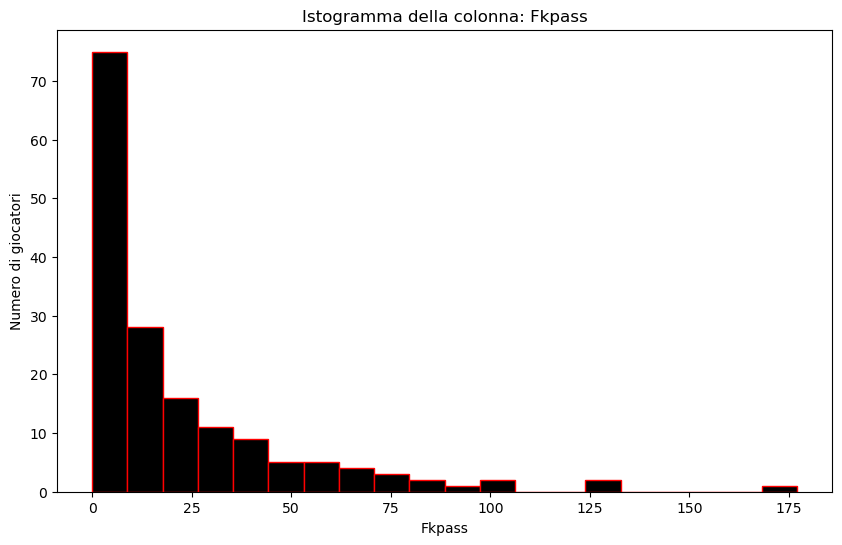

La media di Fkpass per l'anno 2019 è: 21.44


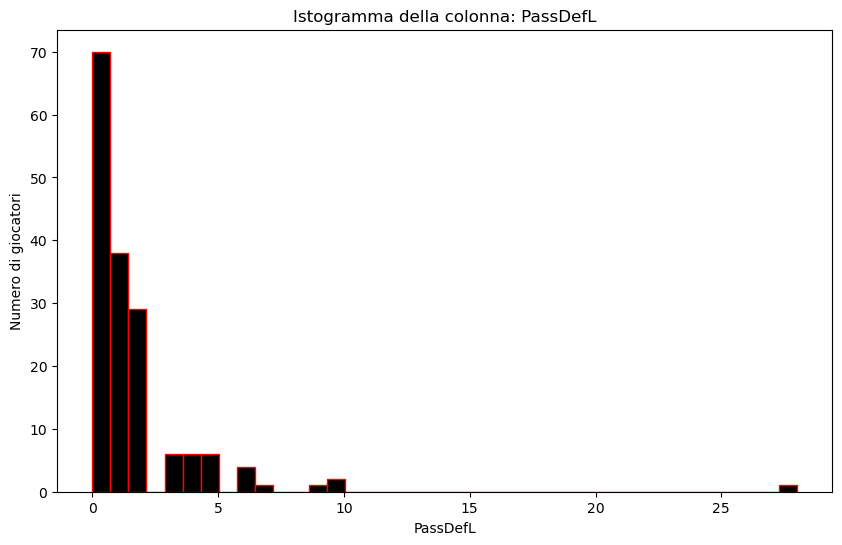

La media di PassDefL per l'anno 2019 è: 1.56


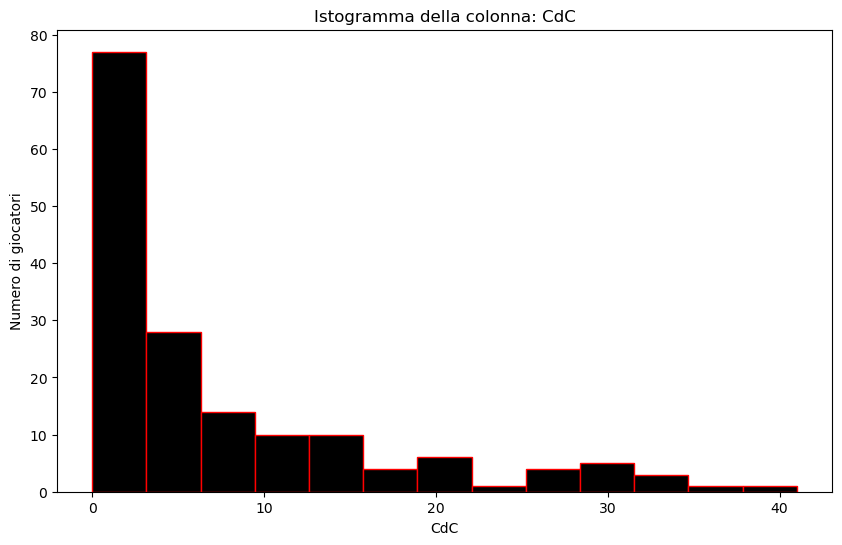

La media di CdC per l'anno 2019 è: 7.46


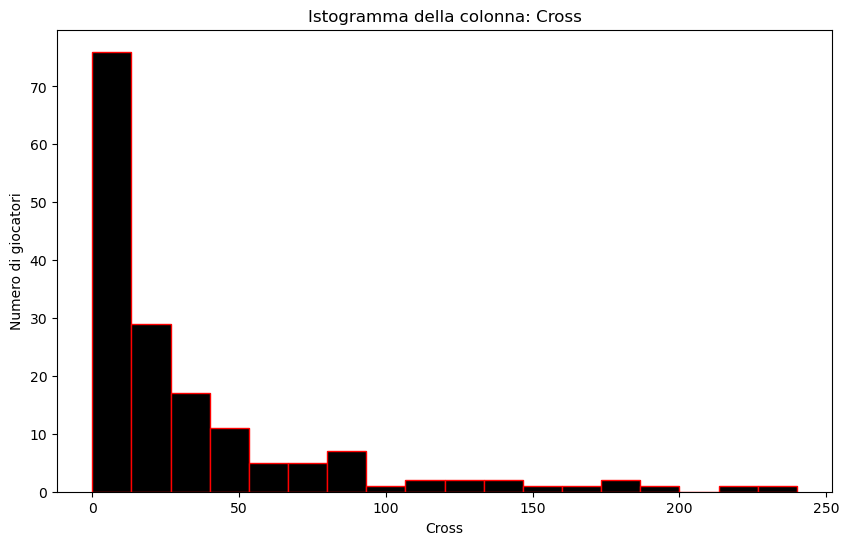

La media di Cross per l'anno 2019 è: 32.41


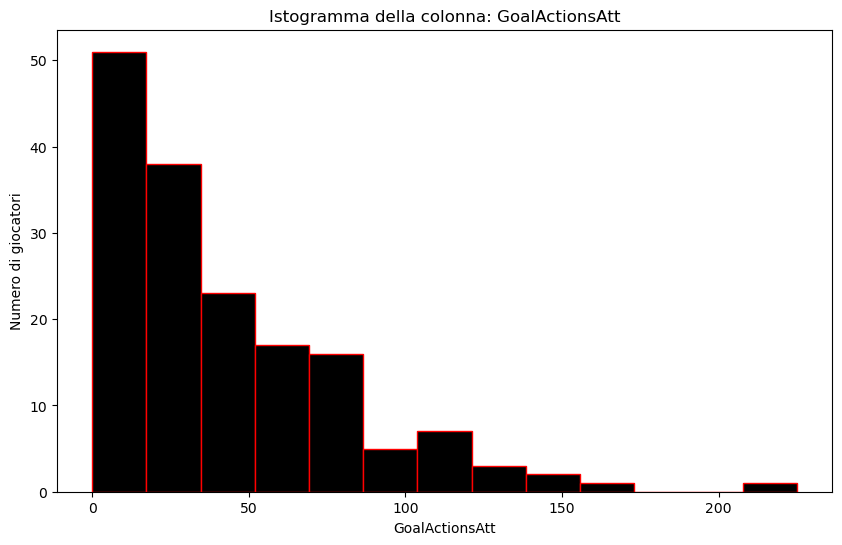

La media di GoalActionsAtt per l'anno 2019 è: 41.86


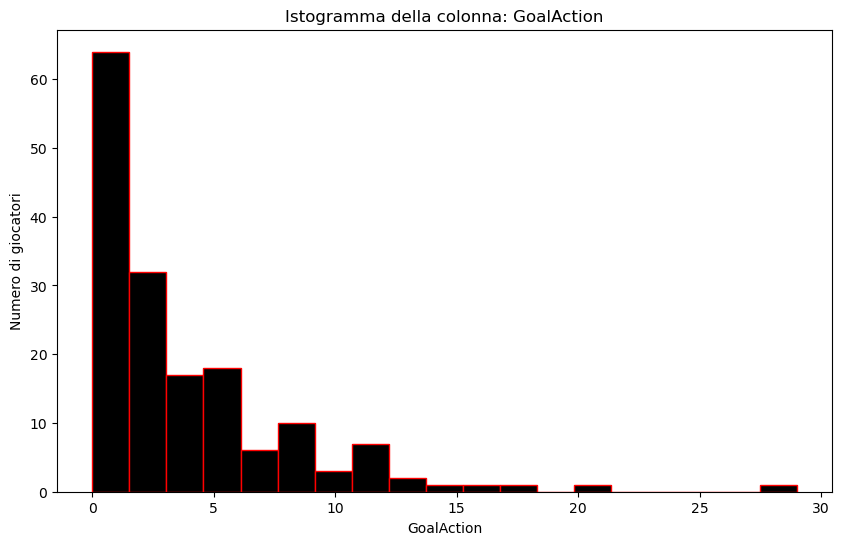

La media di GoalAction per l'anno 2019 è: 3.82


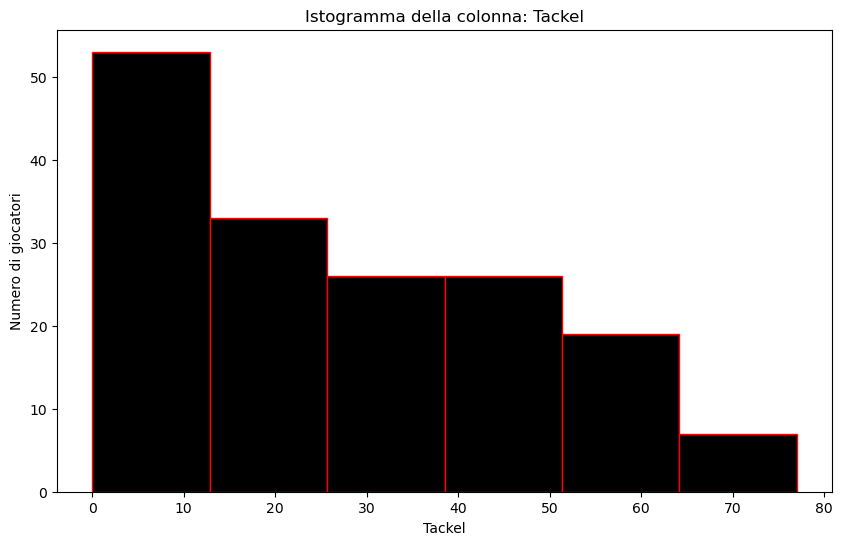

La media di Tackel per l'anno 2019 è: 26.80


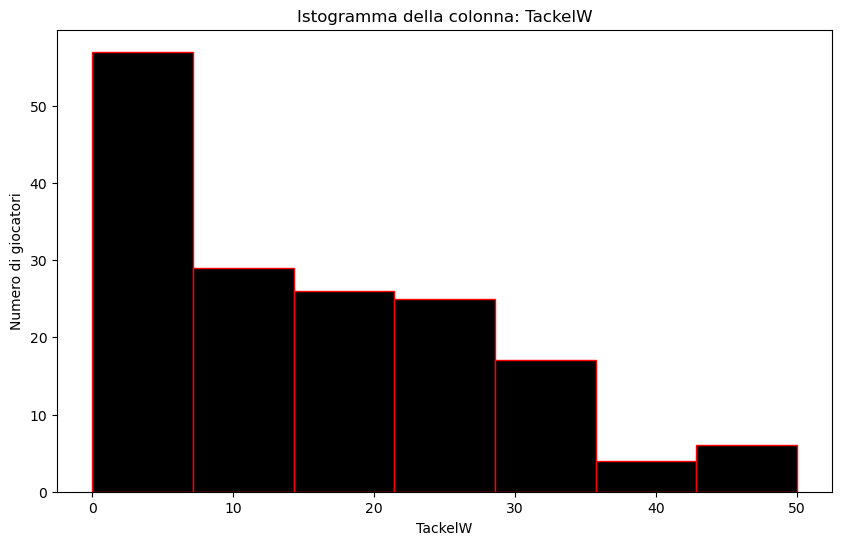

La media di TackelW per l'anno 2019 è: 15.37


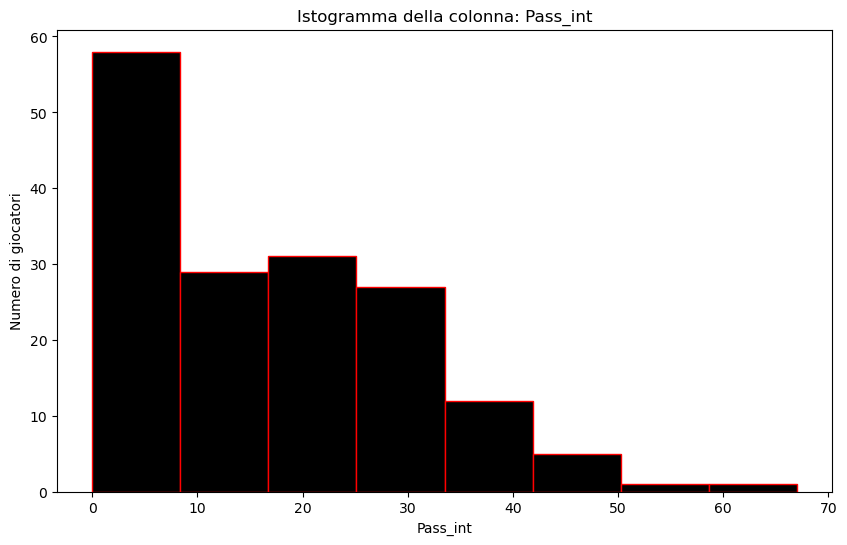

La media di Pass_int per l'anno 2019 è: 16.42


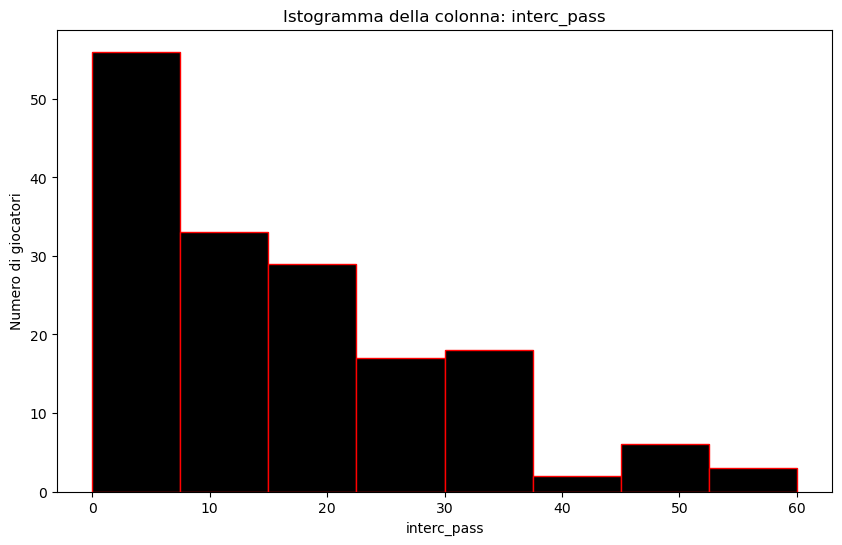

La media di interc_pass per l'anno 2019 è: 15.63


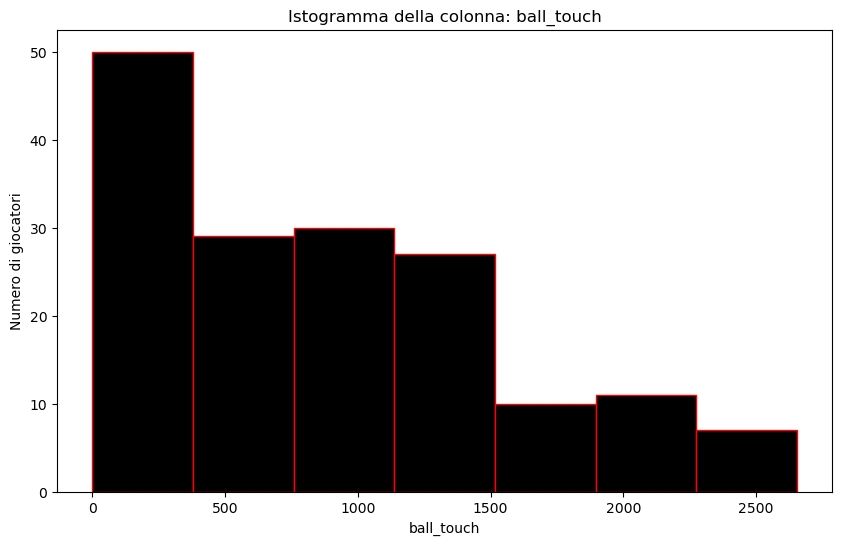

La media di ball_touch per l'anno 2019 è: 877.74


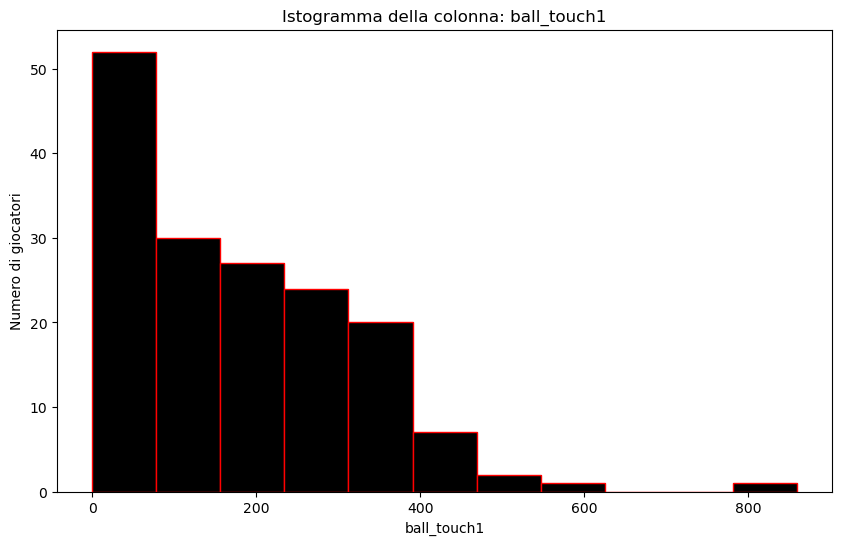

La media di ball_touch1 per l'anno 2019 è: 178.26


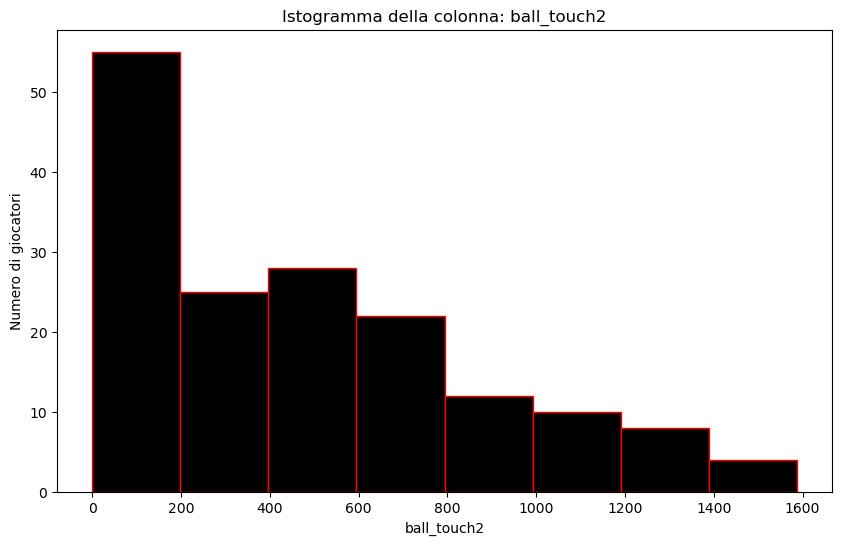

La media di ball_touch2 per l'anno 2019 è: 480.76


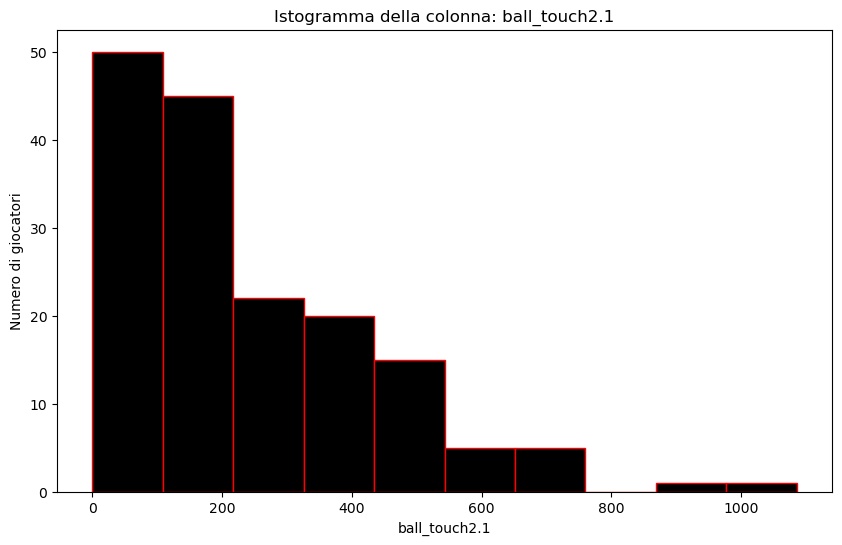

La media di ball_touch2.1 per l'anno 2019 è: 229.79


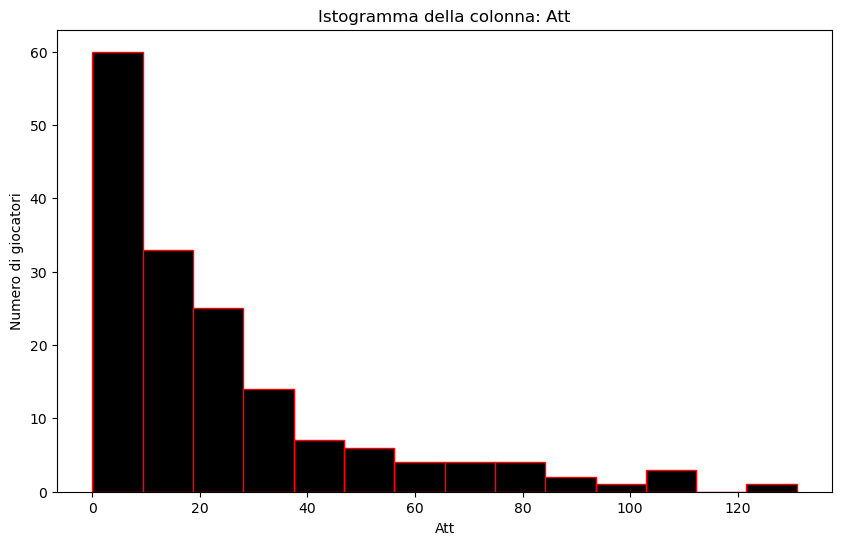

La media di Att per l'anno 2019 è: 23.83


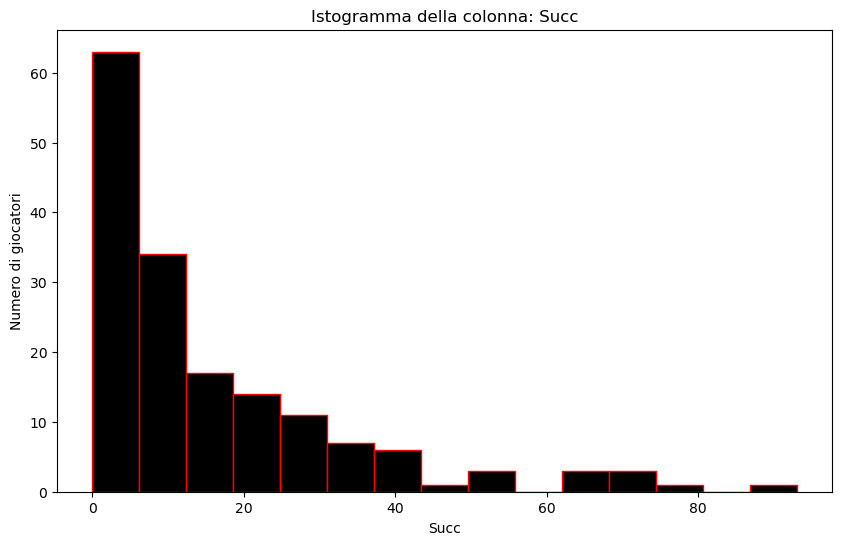

La media di Succ per l'anno 2019 è: 15.80


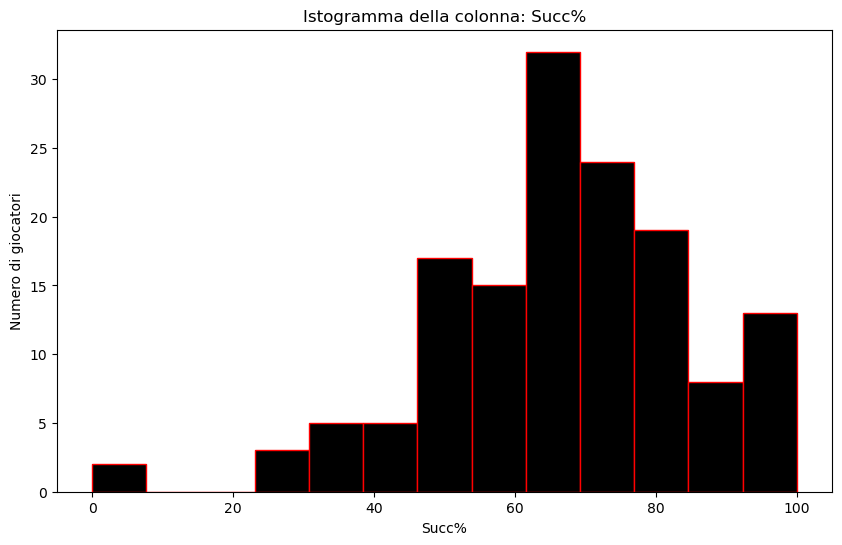

La media di Succ% per l'anno 2019 è: 66.78


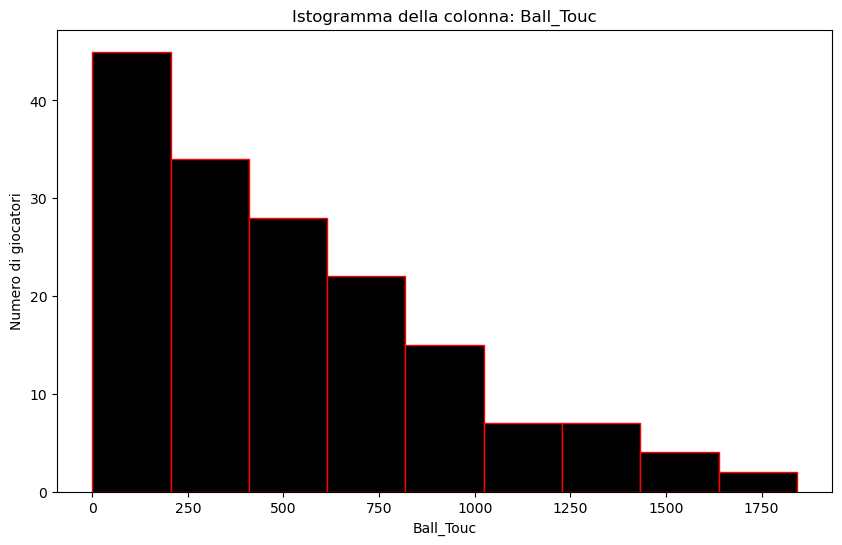

La media di Ball_Touc per l'anno 2019 è: 504.27


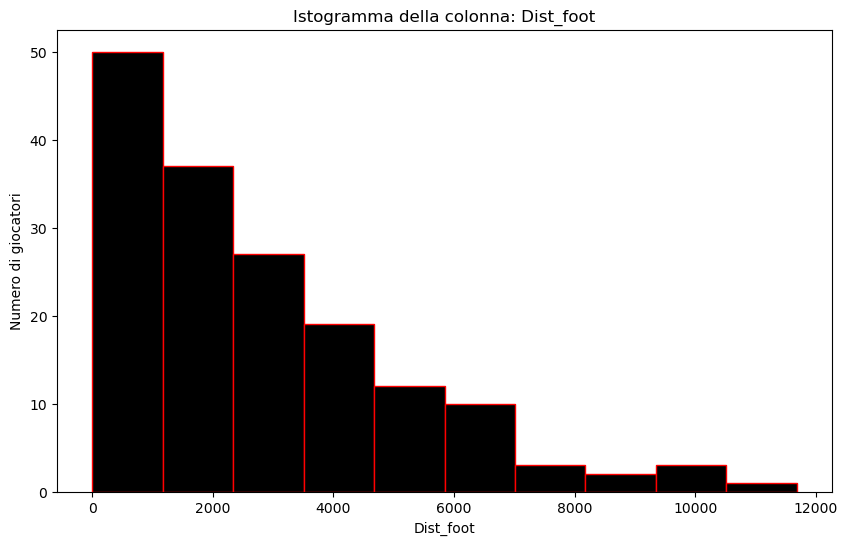

La media di Dist_foot per l'anno 2019 è: 2720.09


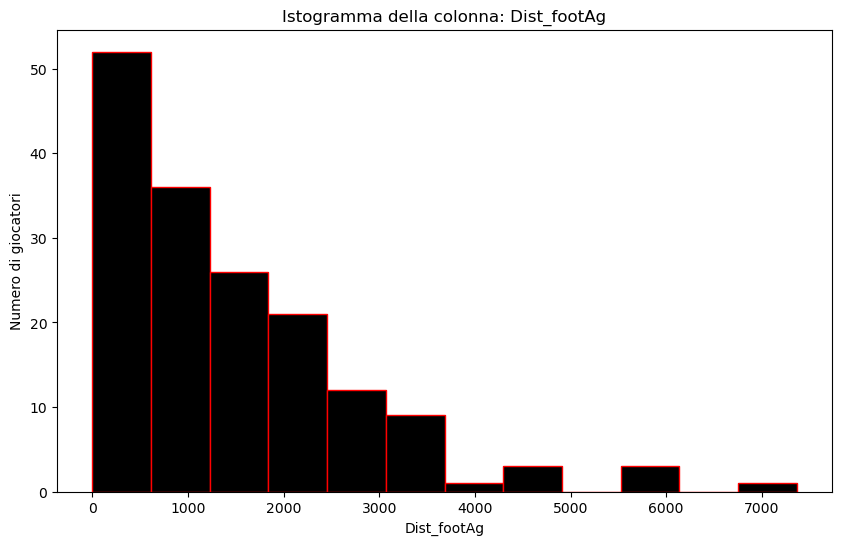

La media di Dist_footAg per l'anno 2019 è: 1398.70


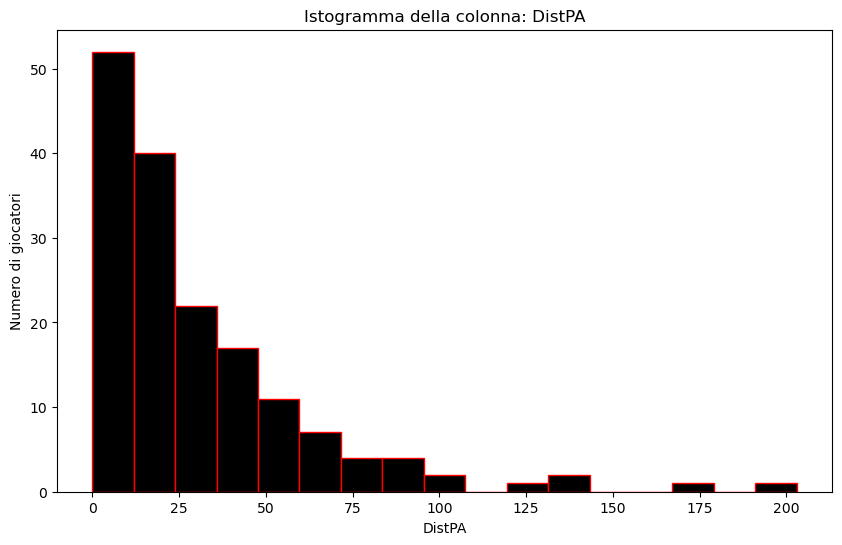

La media di DistPA per l'anno 2019 è: 29.85


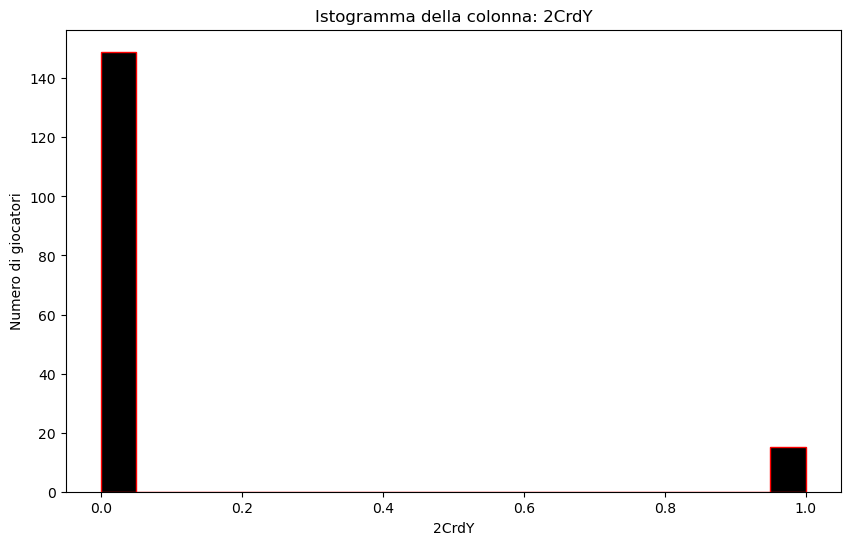

La media di 2CrdY per l'anno 2019 è: 0.09


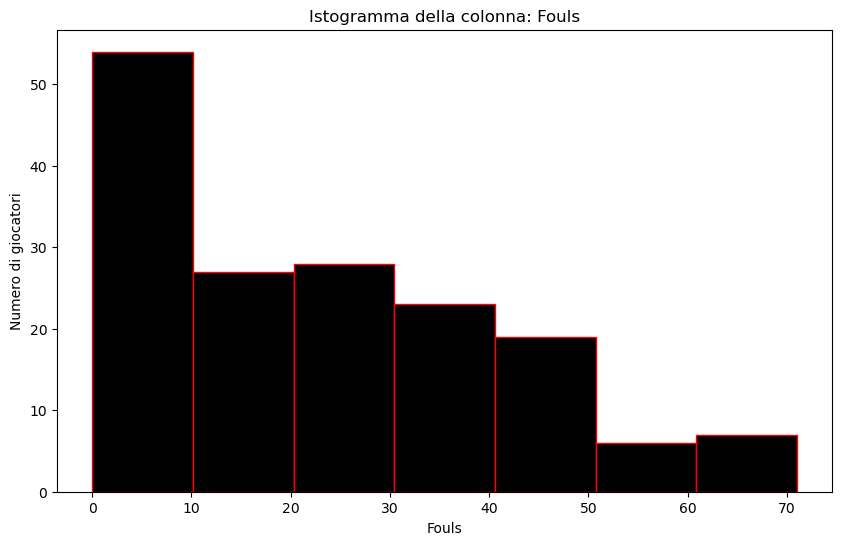

La media di Fouls per l'anno 2019 è: 23.05


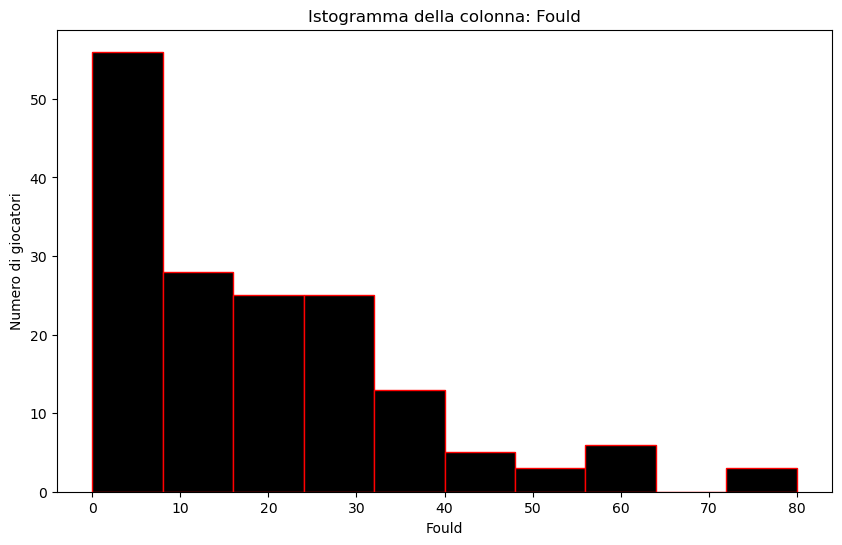

La media di Fould per l'anno 2019 è: 18.34


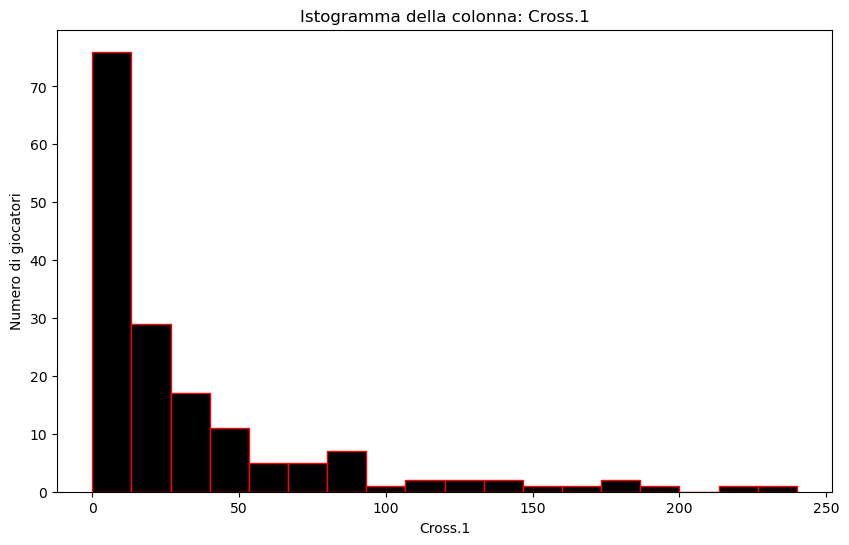

La media di Cross.1 per l'anno 2019 è: 32.41


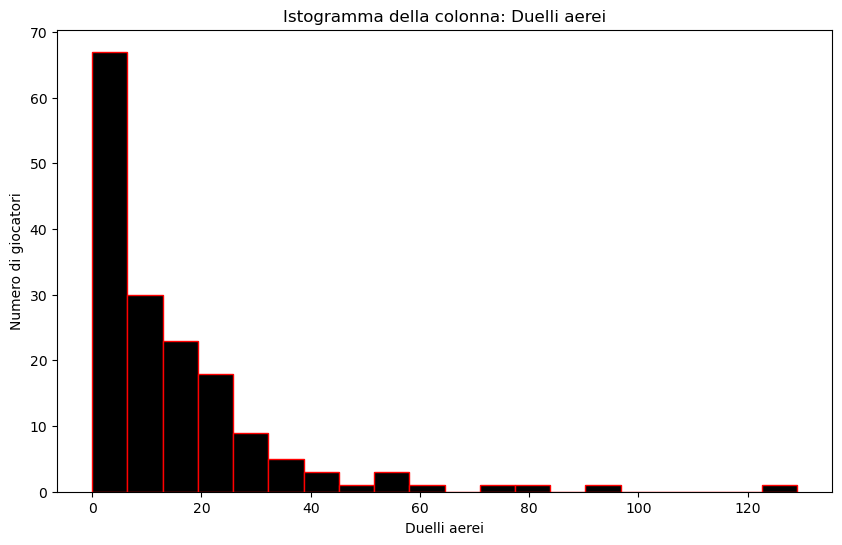

La media di Duelli aerei per l'anno 2019 è: 14.61


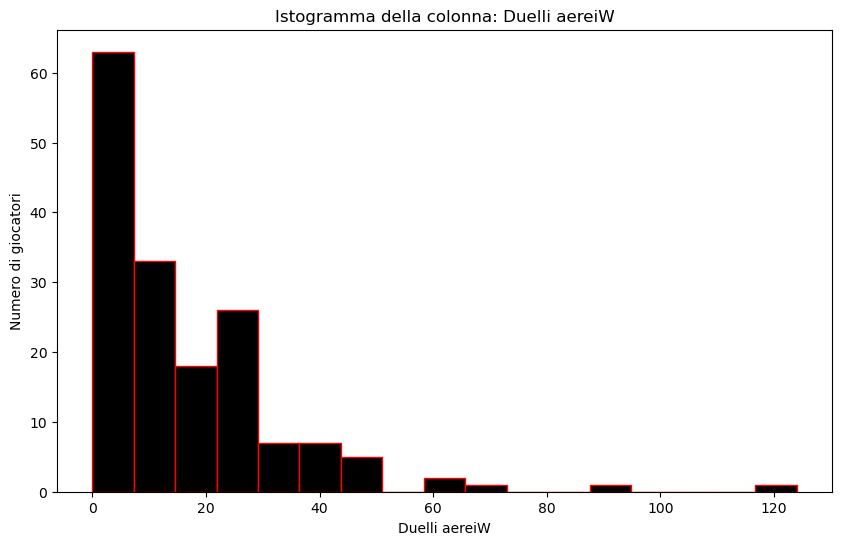

La media di Duelli aereiW per l'anno 2019 è: 16.17


In [23]:
import scipy.stats as stats
import numpy as np

for file in files:
 data = pd.read_excel(file)

# Selezionare solo le colonne numeriche
numeric_data = data.select_dtypes(include=[np.number])

# Funzione per calcolare il numero di bin con la regola di Freedman-Diaconis
def freedman_diaconis_bins(data):
    q25, q75 = np.percentile(data, [25, 75])
    iqr = q75 - q25
    if iqr == 0:  # Evitare divisioni per zero
        return 20  # Numero di bin di default in caso di IQR nullo
    bin_width = 2 * iqr / (len(data) ** (1 / 3))
    if bin_width == 0:
        return 5  # Numero di bin di default in caso di width troppo piccolo
    return int(np.ceil((data.max() - data.min()) / bin_width))

# Creare istogrammi per ogni colonna numerica con controllo su variazioni minime
for column in numeric_data.columns:
    col_data = numeric_data[column].dropna()  # Rimuovi eventuali valori NaN
    if col_data.empty or col_data.max() == col_data.min():
        continue
    
    # Calcolare il numero di bin con la regola di Freedman-Diaconis
    bins = freedman_diaconis_bins(col_data)
    
    # Creare l'istogramma
    plt.figure(figsize=(10, 6))
    plt.hist(col_data, bins=bins, density=False, color='k', edgecolor = 'r', label='Dati')

    # Titolo e etichette
    plt.title(f'Istogramma della colonna: {column}')
    plt.xlabel(f'{column}')
    plt.ylabel('Numero di giocatori')

    # Mostrare il grafico
    plt.show()
    media = col_data.mean()
    print(f"La media di {column} per l'anno {year[file]} è: {media:.2f}")

In [28]:
# Mappatura dei file agli anni
year_mapping= {2023:'centrocampisti_2024.xlsx', 2022:'centrocampisti_2023.xlsx',2022:'centrocampisti_2022.xlsx',2020:'centrocampisti_2021.xlsx',
                2019:'centrocampisti_2020.xlsx'}

def istogramma(statistica, anno):
    # Verifica che l'anno esista nel mapping
    if anno not in year_mapping:
        print(f"L'anno {anno} non è valido. Gli anni disponibili sono: {list(year_mapping.keys())}")
        return

    # Carica il dataset corrispondente all'anno
    file = year_mapping[anno]
    data = pd.read_excel(file)

    # Seleziona la colonna specificata
    if statistica not in data.columns:
        print(f"La statistica '{statistica}' non è presente nei dati.")
        return
    
    col_data = data[statistica].dropna()  # Rimuovi eventuali valori NaN

    if col_data.empty or col_data.max() == col_data.min():
        print(f"La colonna '{statistica}' non ha abbastanza variabilità per creare un istogramma.")
        return

    # Calcolare il numero di bin con la regola di Freedman-Diaconis
    def freedman_diaconis_bins(data):
        q25, q75 = np.percentile(data, [25, 75])
        iqr = q75 - q25
        if iqr == 0:  # Evitare divisioni per zero
            return 20  # Numero di bin di default in caso di IQR nullo
        bin_width = 2 * iqr / (len(data) ** (1 / 3))
        if bin_width == 0:
            return 5  # Numero di bin di default in caso di width troppo piccolo
        return int(np.ceil((data.max() - data.min()) / bin_width))

    # Calcolare il numero di bin
    bins = freedman_diaconis_bins(col_data)

    # Creare l'istogramma
    plt.figure(figsize=(10, 6))
    plt.hist(col_data, bins=bins, density=False, color='k', edgecolor='r', label='Dati')

    # Titolo e etichette con l'anno specificato
    plt.title(f'Istogramma della colonna: {statistica} ({anno})')
    plt.xlabel(f'{statistica}')
    plt.ylabel('Numero di giocatori')

    # Mostrare il grafico
    plt.show()

    # Calcola e stampa la media della colonna
    media = col_data.mean()
    print(f"La media di {statistica} per l'anno {anno} è: {media:.2f}")
    giocatore_max = data.loc[data[statistica].idxmax()]['Player']
    max_value = col_data.max()
    print(f"Il giocatore che ha registrato il maggior numero di {statistica} è {giocatore_max} con {max_value:.2f}.")


Con questa funzione possiamo richiamare dei grafici specifici e analizzarli se ci interessa. Per esempio analizziamo la statistica degli passaggi chiave nel 2020

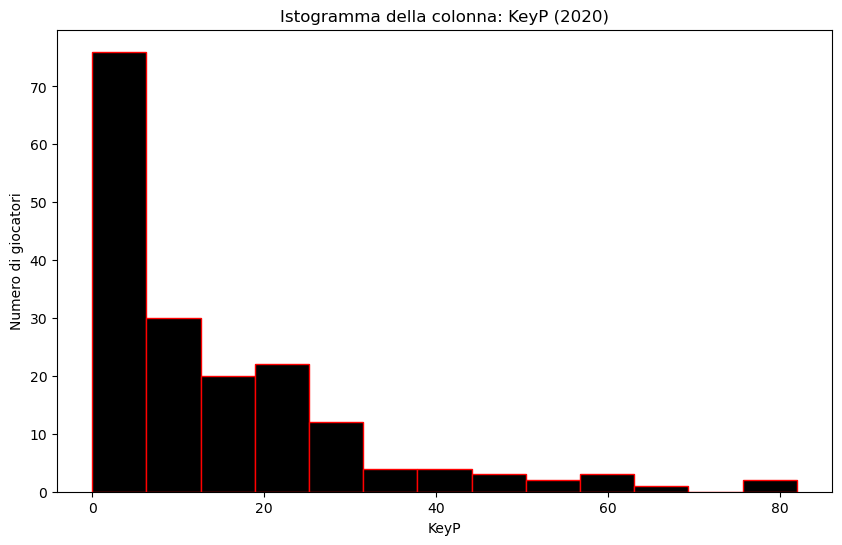

La media di KeyP per l'anno 2020 è: 13.99
Il giocatore che ha registrato il maggior numero di KeyP è Rodrigo De Paul con 82.00.


In [30]:
statistica = 'KeyP'
anno = 2020
istogramma(statistica,anno)

CORRELAZIONI

Questa sezione tratta la correlazione delle statistiche relative ai centrocampisti. 

Analizzare le statistiche dei centrocampisti è fondamentale, poiché esiste una chiara correlazione tra la squadra che vince il campionato e quella che possiede il miglior centrocampo. I centrocampisti, infatti, sono cruciali sia in fase difensiva che offensiva, e in molte partite il giocatore più influente è proprio un centrocampista, a testimonianza dell'importanza strategica di questo ruolo.

L'idea dietro a questa analisi è quella di capire se ci sono delle statistiche ben relazionate con quelle sopracitate, che una squadra può andare ad analizzare per trovare un attaccante d'impatto per la propria squadra. Vogliamo trovare quali sono queste statistiche.

In [31]:
# Importo le librerie necessarie per il codice

import pandas as pd
import plotly.express as px
pd.set_option('display.max_columns', None)

# Elenco dei file da leggere
files = ['centrocampisti_2020.xlsx', 'centrocampisti_2021.xlsx', 'centrocampisti_2022.xlsx', 'centrocampisti_2023.xlsx', 'centrocampisti_2024.xlsx']


# Faccio un dizionario per mappare i file agli anni
year_mapping = {'centrocampisti_2024.xlsx': 2023,'centrocampisti_2023.xlsx': 2022,'centrocampisti_2022.xlsx': 2021,'centrocampisti_2021.xlsx': 2020,'centrocampisti_2020.xlsx': 2019}

Prima di tutto bisogna fare un processo di 'data cleaning' ovvero una pulizia del dataframe, aggiungendo colonne che possono essere utili oppure togliendone altre che non voglio prendere in considerazione.

Per prima cosa togliamo i dati dei cartellini gialli e rossi collezionati dai giocatori, in quanto rappresentano la disciplina di questi e non le loro capacità balistiche. Dopodiche eliminiamo le colonne relative ai calci piazzati in quanto rigori e punizioni hanno i propri specialisti scelti dall'allenatore, che non devono essere obbligatoriamente centrocampisti, che battono tutti quelli che vengono assegnati nelle partite. Non sarebbe quindi equo considerare una statistica alla quale la maggior parte dei giocatori non prendono neanche parte.

Ovviamente scartiamo le celle relative al Nome del giocatore, la Squadra per cui gioca e la sua Nazionalità.
Subito dopo togliamo quelle colonne che rappresentano "operazioni" fra altre statistiche, come ad esempio somme fra due dati, percentuali o rapporti, in quanto non sono statistiche di gioco (realizzate sul campo dal giocatore) ma create ad hoc per altri tipi di analisi non inerenti al nostro.

In [32]:
# Questa parte di codice crea 5 figure che rappresentano il riquadro di correlazione fra le statistiche per annata

correlations = []
years = []

colonne_da_eliminare = ['Player', 'Nation', 'Pos', 'Squad', 'G + A', 'G -PK',
                        'xG-PK', 'Xg kPass', 'npxG+xAG', 'Goals',
                         '%SoT', 'PK', 'PKA', 'xG', 'X-XG', '%Pass', '%PoT',  '%PoT2', '%PoT3', 'Ass',
                        'Succ%']

for file in files:
    
    data_frame = pd.read_excel(file)
    # Uso .drop per rimuovere dal data frame quelle statistiche che non voglio usare in questa analisi
    data_frame.drop(columns=colonne_da_eliminare, inplace=True) 

    corr_matrix = data_frame.corr()  # Calcolo la matrice di correlazione

    year = year_mapping[file]  # Ottengo l'anno dal file usando il mapping
    years.append(year)

    fig = px.imshow(corr_matrix, title=f"Matrice di Correlazione - Anno {year}")
    # Ottengo in output il grafico di correlazione

    fig.show()

# Inserisco questa riga di codice in modo da poter visualizzare le colonne usate per l'analisi
print(f'Le colonne usate per questa analisi sono {list(data_frame.columns)}')


C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Le colonne usate per questa analisi sono ['Age', 'MP', 'Starts', 'Min', 'Assist', 'YCrd', 'RCrd', 'PrgC', 'PrgP', 'PrgPr', 'Goals.1', 'Shot', 'SoT', 'PK.1', 'PKA.1', 'xG.1', 'Pass', 'PassA', 'D(yrd)', 'PrgDist', 'PoT1', 'xPoT1', 'PoT2', 'xPoT2', 'PoT3', 'xPoT3', 'xAss', 'KeyP', 'PPA', 'CPA', 'PrgP.1', 'Fkpass', 'PassDefL', 'CdC', 'Cross', 'GoalActionsAtt', 'GoalAction', 'Tackel', 'TackelW', 'Pass_int', 'interc_pass', 'ball_touch', 'ball_touch1', 'ball_touch2', 'ball_touch2.1', 'Att', 'Succ', 'Ball_Touc', 'Dist_foot', 'Dist_footAg', 'DistPA', '2CrdY', 'Fouls', 'Fould', 'Cross.1', 'Duelli aerei', 'Duelli aereiW']


In [33]:
# Creo una funzione che mi permette di scoprire quali sono le statistiche meglio e peggio correlate con una desiderata

def best_worst(stat):
 for file in files:
    year = year_mapping[file]
    data_frame = pd.read_excel(file)

    data_frame.drop(columns=colonne_da_eliminare, inplace=True) 

    corr_matrix = data_frame.corr()

    if stat in corr_matrix.columns:
        # Ordina le correlazioni con la statistica scelta
        sorted_corr = corr_matrix[stat].sort_values(ascending=False)

        # Trova le 5 migliori e peggiori correlazioni (cambiare i range per saperne di più o di meno)
        best_corr = sorted_corr[1:6]  # Parto da 1 per evitare la correlazione della statistica con se stessa
        worst_corr = sorted_corr[-5:]

        print(f"Anno {year}: Le 5 statistiche meglio correlate con {stat} sono:\n{best_corr}")
        print(f"Anno {year}: Le 5 statistiche peggio correlate con {stat} sono:\n{worst_corr}")
    else:
        print(f"La statistica {stat} non è presente nel dataset. Controlla l'input")

# Creo una funzione che restituisce l'elenco degli indci di correlazione di una statistica con le altre anno per anno

def correlazioni_annuali(stat):
    for file in files:
        year = year_mapping[file]
        data_frame = pd.read_excel(file)  

        data_frame.drop(columns=colonne_da_eliminare, inplace=True)

        corr_matrix = data_frame.corr()

        if stat in corr_matrix.columns:
            sorted_corr = corr_matrix[stat].sort_values(ascending=False)

            print(f"Anno {year}: Le correlazioni per {stat} sono:\n{sorted_corr}\n")
        else:
            print(f"La statistica {stat} non è presente nel dataset dell'anno {year}.")
        
# Creo una seconda funzione che mi dice l'indice di correlazione di due statistiche specifiche
# ed il cambiamento di questo nel corso delle stagioni

def correlazione(stat1,stat2):
 correlations = []

 for file in files:
    
    data_frame = pd.read_excel(file)

    data_frame.drop(columns=colonne_da_eliminare, inplace=True)

    corr_matrix = data_frame.corr()

    year = year_mapping[file]

    # Verifica se entrambe le statistiche esistono nella matrice di correlazione
    if stat1 in corr_matrix.columns and stat2 in corr_matrix.columns:
        correlation_value = corr_matrix.loc[stat1, stat2]
        correlations.append((year, correlation_value))
        #print(f"Anno {year}: Correlazione tra {stat1} e {stat2} = {correlation_value}")
    else:
        correlations.append((year, None))

# Creazione del DataFrame per il grafico
 if stat1 in corr_matrix.columns and stat2 in corr_matrix.columns:
    correlation_df = pd.DataFrame(correlations, columns=['Anno', 'Correlazione'])
    
    # Crea il grafico dell'andamento della correlazione nel tempo
    fig = px.line(correlation_df, x='Anno', y='Correlazione', title=f"Correlazione tra {stat1} e {stat2}", markers=True)
    fig.update_xaxes(dtick=1)
    fig.update_yaxes(range = [-1,1], dtick = 0.10)
    fig.show()
 else:
    print("Nessun grafico disponibile: non sono state calcolate correlazioni valide. Controlla l'input")

Otteniamo in output i 5 grafici richiesti relativi alle 5 stagioni prese in considerazione. La barra sulla destra indica l'indice di correlazione in base al colore del quadrato relativo a due colonne. Muovendo il cursore sulle colonne si può vedere le due statistiche prese in considerazione ed il loro indice di correlazione.

La presenza dei colori ci aiuta subito a notare che i grafici si assomigliano molto, nonostante vengano presi in considerazione 5 anni diversi nei quali hanno giocato molti giocatori diversi stagione per stagione. Immaginiamo quindi che gli indici di correlazione rimangano abbastanza costanti durante gli anni. Questo ci fa molto comodo, in quanto ci rassicura sul fatto che i risultati che troveremo non saranno casuali ma validi nel corso degli anni.

Oltre a questa osservazione possiamo anche notare, riconoscendo i colori, che ci sono statistiche mal correlate con tutte le altre. Salta subito all'occhio la colonna relativa ai Minuti giocati, indicata con 'Min'.

In [34]:
stat = 'Min'
best_worst(stat)

stat1 = 'Min'
stat2 = 'KeyP'
correlazione(stat1,stat2)

stat2 = 'interc_pass'
correlazione(stat1,stat2)

Anno 2019: Le 5 statistiche meglio correlate con Min sono:
Age      0.145928
PKA.1   -0.053561
PK.1    -0.095144
2CrdY   -0.105715
RCrd    -0.145294
Name: Min, dtype: float64
Anno 2019: Le 5 statistiche peggio correlate con Min sono:
TackelW    -0.337696
Fouls      -0.343988
Pass_int   -0.353898
Tackel     -0.356630
Starts     -0.367356
Name: Min, dtype: float64
Anno 2020: Le 5 statistiche meglio correlate con Min sono:
2CrdY    0.063584
Age      0.041688
RCrd     0.023436
PK.1    -0.099853
PKA.1   -0.101855
Name: Min, dtype: float64
Anno 2020: Le 5 statistiche peggio correlate con Min sono:
TackelW      -0.332108
Tackel       -0.332946
xPoT1        -0.338037
ball_touch   -0.339779
Starts       -0.388574
Name: Min, dtype: float64
Anno 2021: Le 5 statistiche meglio correlate con Min sono:
Age     -0.003208
PKA.1   -0.068810
2CrdY   -0.135873
RCrd    -0.138362
PK.1    -0.139249
Name: Min, dtype: float64
Anno 2021: Le 5 statistiche peggio correlate con Min sono:
PrgP             -0.335565

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Non c'è bisogno di richiamare tutti i valori, ci basta usare le funzioni per confermare ciò che pensavamo. 
Nel corso degli anni il range di correlazione risulta sempre essere vicino allo 0. Questo è sicuramente il primo risultato grosso ed inaspettato di questa analisi in quanto ci aspettavamo che un minutaggio elevato avesse un grosso impatto sulle statistiche del singolo. 
Vediamo come l'andamento dell'indice di correlazione risulta costantemente vicino allo 0 nel corso degli anni.

Da un certo punto di vista però è un risultato che ci piace in quanto suggerisce che il rendimento di un attaccante non dipenda banalmente da quanto gioca ma da come gioca. Tutto ciò da ancora più valore alla nostra ricerca.

Questo risultato interessante appena trovato sui minuti ci suggerisce di testare le correlazioni delle altre statistiche non di campo ovvero 'Age' 'Starts' 'MP', rispettivamente, Età del giocatore, numero di partite titolare e numero totale di partite in cui ha giocato. Analizziamole separatamente una per volta.

In [35]:
stat = 'Age'
correlazioni_annuali(stat)

stat1 = 'Age'
stat2 = 'KeyP'
correlazione(stat1,stat2)

stat2 = 'interc_pass'
correlazione(stat1,stat2)



Anno 2019: Le correlazioni per Age sono:
Age               1.000000
MP                0.297040
Tackel            0.287165
Starts            0.283390
ball_touch1       0.282931
Pass_int          0.272471
TackelW           0.261909
PrgDist           0.261399
ball_touch2       0.260519
ball_touch        0.257509
PassA             0.256393
PoT1              0.254448
Pass              0.253203
xPoT1             0.252626
xPoT2             0.252062
D(yrd)            0.246921
PoT2              0.246242
interc_pass       0.232623
xPoT3             0.231782
PrgP.1            0.224663
PrgP              0.224663
Fkpass            0.216758
YCrd              0.215860
Ball_Touc         0.213696
PoT3              0.208964
Fouls             0.194294
Duelli aerei      0.187141
Fould             0.180166
Dist_foot         0.178652
ball_touch2.1     0.169774
Dist_footAg       0.166700
KeyP              0.161291
GoalActionsAtt    0.156516
PPA               0.152199
Min               0.145928
CdC           

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Anno 2023: Le correlazioni per Age sono:
Age               1.000000
PrgP              0.397387
PrgP.1            0.397387
PrgDist           0.387779
PassA             0.384863
Att               0.383606
xPoT1             0.381231
PassDefL          0.380703
Starts            0.378354
Dist_foot         0.377742
Pass              0.376763
ball_touch2.1     0.376484
PoT1              0.375606
D(yrd)            0.371340
xPoT2             0.363674
ball_touch        0.363510
ball_touch1       0.361655
xPoT3             0.361395
interc_pass       0.360958
DistPA            0.360687
ball_touch2       0.359892
Dist_footAg       0.356857
PoT2              0.355773
MP                0.352793
PoT3              0.344358
PPA               0.341494
GoalAction        0.333956
Assist            0.325392
xAss              0.321915
GoalActionsAtt    0.319207
Pass_int          0.318137
Tackel            0.310873
YCrd              0.310831
TackelW           0.305688
Shot              0.303750
Fouls         

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



 Possiamo notare come nel corso degli anni gli indici di correlazione siano rimasti in un range simile, vicino allo 0. Altro risultato inaspettato, in quanto pensavamo che l'esperienza di un giocatore più anziano oppure la freschezza e fantasia di un giovane potessero influire sulla performance di questo. Le nostre statistiche di interesse, ovviamente, stanno nei range appena citati e quindi vale lo stesso discorso.

In [37]:
stat = 'Starts'
correlazioni_annuali(stat)

stat1 = 'Starts'
stat2 = 'KeyP'
correlazione(stat1,stat2)

stat2 = 'interc_pass'
correlazione(stat1,stat2)


Anno 2019: Le correlazioni per Starts sono:
Starts            1.000000
MP                0.953240
ball_touch        0.950479
PassA             0.929716
Ball_Touc         0.915069
ball_touch2       0.910883
xPoT2             0.905065
xPoT1             0.903558
Pass              0.903128
Tackel            0.899239
D(yrd)            0.896056
Dist_foot         0.893848
Pass_int          0.887921
PrgP.1            0.887721
PrgP              0.887721
PoT1              0.887420
PrgDist           0.882098
PoT2              0.875788
ball_touch1       0.872680
GoalActionsAtt    0.869371
TackelW           0.869258
ball_touch2.1     0.868263
Fouls             0.864944
Dist_footAg       0.859074
xPoT3             0.825980
KeyP              0.820752
interc_pass       0.820531
PoT3              0.813416
Fould             0.808911
PPA               0.784297
YCrd              0.775693
xAss              0.766689
Att               0.744743
Succ              0.729745
Shot              0.728687
PrgC       

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Anno 2023: Le correlazioni per Starts sono:
Starts            1.000000
ball_touch        0.993349
Att               0.954171
PassA             0.932915
Dist_foot         0.931019
ball_touch2.1     0.930023
Dist_footAg       0.922986
MP                0.916542
xPoT1             0.916003
PrgP.1            0.914676
PrgP              0.914676
Pass              0.909318
DistPA            0.906247
PoT1              0.900557
ball_touch2       0.899731
Pass_int          0.899478
D(yrd)            0.897993
xPoT2             0.897546
Tackel            0.890160
GoalActionsAtt    0.889623
PrgDist           0.880449
ball_touch1       0.878262
TackelW           0.874202
PoT2              0.873612
Fouls             0.862350
xPoT3             0.841377
interc_pass       0.830339
PoT3              0.822936
Fould             0.810263
KeyP              0.794828
PrgC              0.787039
Shot              0.786166
PPA               0.762247
YCrd              0.760184
Succ              0.753768
xAss       

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Questa statistica è correlata bene con alcune e male con altre. Notiamo, inoltre, come si relazioni abbastanza bene con le statistiche interessanti. Il risultato in realtà è abbastanza prevedibile in quanto è nell'interesse delle squadre schierare titolari i giocatori migliori che quindi registrano dati migliori.

In [38]:
stat = 'MP'
correlazioni_annuali(stat)

stat1 = 'MP'
stat2 = 'KeyP'
correlazione(stat1,stat2)

stat2 = 'interc_pass'
correlazione(stat1,stat2)


Anno 2019: Le correlazioni per MP sono:
MP                1.000000
Starts            0.953240
ball_touch        0.906694
PassA             0.884346
xPoT1             0.875112
Ball_Touc         0.873225
Pass_int          0.869246
Tackel            0.867845
ball_touch2       0.866585
Pass              0.861523
PoT1              0.860254
Fouls             0.852822
xPoT2             0.850815
D(yrd)            0.844998
Dist_foot         0.840603
TackelW           0.838461
ball_touch1       0.833949
ball_touch2.1     0.831229
PrgP.1            0.827013
PrgP              0.827013
PrgDist           0.824702
PoT2              0.823476
GoalActionsAtt    0.816822
Dist_footAg       0.806047
interc_pass       0.794521
Fould             0.770801
KeyP              0.766266
YCrd              0.763604
xPoT3             0.758361
PoT3              0.749989
PPA               0.726857
Att               0.707378
Shot              0.696875
xAss              0.693826
Succ              0.690005
DistPA         

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Anno 2023: Le correlazioni per MP sono:
MP                1.000000
ball_touch        0.936761
Starts            0.916542
Att               0.876359
Pass_int          0.860600
PassA             0.850491
Dist_foot         0.849536
ball_touch2.1     0.846771
Dist_footAg       0.843349
Fouls             0.841024
xPoT1             0.839335
Tackel            0.838607
GoalActionsAtt    0.831871
DistPA            0.826748
PrgP.1            0.823979
PrgP              0.823979
Pass              0.823725
PoT1              0.821943
TackelW           0.820613
ball_touch2       0.818682
xPoT2             0.812301
D(yrd)            0.809598
ball_touch1       0.797749
PrgDist           0.790573
PoT2              0.786790
Shot              0.783664
Fould             0.777670
xPoT3             0.759384
Duelli aereiW     0.755826
KeyP              0.753294
YCrd              0.744228
PrgC              0.741775
Succ              0.740507
interc_pass       0.737393
PoT3              0.733801
xAss           

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Il discorso riguardante il numero di partite giocate è il medesimo a quello precedente, è nell'interesse della squadra far giocare i giocatori migliori e quindi ci aspettavamo che fosse ben correlato.

Adesso ci concentriamo su quei dati che un centrocampista registra quando messo a confronto con gli avversari, ovvero dribbling, contrasti, numero di tocchi, conduzioni di palla, distanza percorsa palla al piede, falli subiti, duelli aerei e sopratutto le statistiche relative ai passaggi.

In [39]:
correlations = []
years = []

colonne_da_eliminare = ["Player", "Nation", "Pos", "Squad", "Age", "MP", "Starts", "Min", "G + A", "G -PK","Assist",
                        "PK", "PKA", "YCrd", "RCrd", "xG", "xG-PK", "Xg kPass", "npxG+xAG", "PrgC", "PrgP", "PrgPr", "Goals",
                        "Shot", "SoT", "%SoT", "PK", "PKA", "xG", "X-XG", "%Pass", "D(yrd)", "PrgDist", "PoT1",
                        "xPoT1", "%PoT", "PoT2", "xPoT2", "%PoT2", "PoT3", "xPoT3", "%PoT3", "Ass", "xAss", "PPA",
                        "CPA", "PrgP", "Fkpass", "PassDefL", "CdC", "Cross", "GoalActionsAtt", "GoalAction",
                        "Att", "Succ", "Succ%", "DistPA", "2CrdY","Cross"]

for file in files:
    
    data_frame = pd.read_excel(file)
    data_frame.drop(columns=colonne_da_eliminare, inplace=True) 

    corr_matrix = data_frame.corr()

    year = year_mapping[file] 
    years.append(year)

    fig = px.imshow(corr_matrix, title=f"Matrice di Correlazione - Anno {year}")
    fig.show()

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Dal range di correlazione indicato sulla destra capiamo come alcune statistiche siano correlate male e dal colore possiamo individuarle.Indirizziamo questa analisi per le due statistiche piu rilevanti di un centrocampista; una offensiva (passaggi chiave) e una difensiva(passaggi intercettati).

Riguardo ai passaggi chiave si nota che non sono correlati con duelli aerei(0.3), tackel(0.59) e  falli commessi (0.53). Risultano più correlati invece con i falli subiti(0.63), ciò è dovuto al fatto che un centrocampista che effettua passaggi chiave è solito operare nel terzo di campo offensivo, dunque non in zone di campo dove si commettono falli. 
Passando alle statistiche correlate notiamo passaggi(0.7) , passaggi progressivi (0.8), cross(0.81) e distanza palla al piede(0.85).
Tra queste statistiche non ci stupiamo delle prime tre, poichè passaggi progressivi e cross non sono altro che una sezione di passaggi chiave. 
Merita un discorso a parte invece la statistica relativa alla distanza palla al piede. Ci saremmo aspettati correlazione con passaggi chiave, ma non cosi elevata (0.85), poichè per effettuare passaggi chiave talvolta, ma non sempre,  i giocatori che riescono a percorrere distanze significative con la palla al piede hanno maggiori possibilità di disorganizzare la difesa avversaria e, di conseguenza, creare o effettuare passaggi chiave efficaci.  Infatti i giocatori che percorrono lunghe distanze con la palla al piede tendono a portare il gioco avanti, rompendo le linee di pressione avversarie e attirando difensori su di sé. Questo può creare spazi utili per compagni di squadra in posizioni avanzate, dove diventano possibili passaggi chiave.


Riguardo ai passaggi intercettati si nota che non sono correlati con statistiche prettamente offensive come ad esempio goal(0.34). Risultano correlati con statistiche di passaggi (0.72),tocchi di palla (0.77) e come atteso con tackel(0.83).

In [40]:
#Correlazione delle statistiche sopracitate nel tempo
# Passaggi chiave

stat1 = 'KeyP'
stat2 = 'Dist_foot'
correlazione(stat1,stat2)

stat2 = 'PassA'
correlazione(stat1,stat2)

stat2 = 'TackelW'
correlazione(stat1,stat2)

stat2 = 'Tackel'
correlazione(stat1,stat2)

# Passaggi intercettati

stat1 = 'interc_pass'
stat2 = 'PrgP'
correlazione(stat1,stat2)

stat2 = 'Fouls'
correlazione(stat1,stat2)

stat2 = 'TackelW'
correlazione(stat1,stat2)

stat2 = 'Tackel'
correlazione(stat1,stat2)


C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



Nessun grafico disponibile: non sono state calcolate correlazioni valide. Controlla l'input


C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed



In [47]:
import pandas as pd
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import numpy as np  # Importa numpy per la gestione delle trasformazioni

# Percorsi dei file Excel
f1 = "centrocampisti_2020.xlsx"
f2 = "centrocampisti_2021.xlsx"
f3 = "centrocampisti_2022.xlsx"
f4 = "centrocampisti_2023.xlsx"
f5 = "centrocampisti_2024.xlsx"

# Colonne da eliminare
colonne_da_eliminare = ["Player", "Nation", "Pos", "Squad", "Age", "MP", "Starts", "Min", "G + A", "G -PK","Assist",
                        "PK", "PKA", "YCrd", "RCrd", "xG", "xG-PK", "Xg kPass", "npxG+xAG", "PrgC", "PrgP", "PrgPr", "Goals",
                        "Shot", "SoT", "%SoT", "PK", "PKA", "xG", "X-XG", "%Pass", "D(yrd)", "PrgDist", "PoT1",
                        "xPoT1", "%PoT", "PoT2", "xPoT2", "%PoT2", "PoT3", "xPoT3", "%PoT3", "Ass", "xAss", "PPA",
                        "CPA", "PrgP", "Fkpass", "PassDefL", "CdC", "Cross", "GoalActionsAtt", "GoalAction",
                        "Att", "Succ", "Succ%", "DistPA", "2CrdY","Cross"]

# Leggi e unisci i file Excel
df1 = pd.read_excel(f1)
df2 = pd.read_excel(f2).iloc[1:].reset_index(drop=True)
df3 = pd.read_excel(f3).iloc[1:].reset_index(drop=True)
df4 = pd.read_excel(f4).iloc[1:].reset_index(drop=True)
df_unito = pd.concat([df1, df2, df3, df4], ignore_index=True)

# Rimuovi le colonne specificate dal DataFrame unito
df_unito = df_unito.drop(columns=colonne_da_eliminare, errors='ignore')

# Carica il file centrocampisti_23.xlsx e rimuovi le stesse colonne
df5 = pd.read_excel(f5).iloc[1:].reset_index(drop=True)
df5 = df5.drop(columns=colonne_da_eliminare, errors='ignore')

# Separare le colonne in input e output
X = df_unito.drop(columns=['KeyP','interc_pass'])
y = df_unito[['KeyP','interc_pass']] 

# Pre-elaborazione
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Divisione in set di addestramento e test
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Costruzione della rete neurale
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(y_train.shape[1])
])

# Compilazione del modello
model.compile(optimizer='adam', loss='mean_squared_error')

# Addestramento del modello
model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.2)

# Carica il nuovo file e pre-processa i dati
df_new = df5  # Usa il DataFrame df5 che abbiamo già elaborato

# Verifica che le colonne siano allineate con il DataFrame di addestramento
X_new = df_new[X.columns]

# Pre-elabora i dati nuovi (normalizza con lo stesso scaler usato per l'addestramento)
X_new_scaled = scaler.transform(X_new)

# Usa il modello per fare previsioni
y_pred = model.predict(X_new_scaled)

# Imposta a 0 tutti i valori predetti che sono minori di 0
y_pred = np.clip(y_pred, 0, None)  # Sostituisci i valori negativi con 0

# Visualizza le previsioni
df_new['Pred_KeyP'] = y_pred[:, 0]  # Previsioni per la prima colonna (Gls)
df_new['Pred_intercBall'] = y_pred[:, 1]  # Previsioni per la seconda colonna (Ast)

print(df_new[['KeyP','interc_pass','Pred_KeyP','Pred_intercBall']])





# Calcola separatamente la somma delle previsioni per Gls e Ast
somma_Kp_Attesi = df_new['Pred_KeyP'].sum()
somma_Ib_Attesi = df_new['Pred_intercBall'].sum()

# Visualizza la somma
print(f"La somma dei passaggi chiave ottenuti dalla rete neurale è: {somma_Kp_Attesi}")
print(f"La somma delle palle intercettate ottenuti dalla rete neurale è: {somma_Ib_Attesi}")
somma_tot= somma_Kp_Attesi + somma_Ib_Attesi

# Visualizza la somma
print(f"La somma dei passaggi chiave e passaggi intercettati ottenuti dalla rete neurale è: {somma_tot}")

# Calcola separatamente la somma effettiva dei goal e assist nei dati originali
somma_Kp_effettiva = df_new['KeyP'].sum()
somma_Ib_effettiva = df_new['interc_pass'].sum()

somma_effettiva = somma_Kp_effettiva + somma_Ib_effettiva

print(f"La somma dei passaggi chiave e passaggi intercettati effettiva è: {somma_effettiva}")

Epoch 1/500


C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Unknown extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning:

Conditional Formatting extension is not supported and will be removed

C:\Users\Mario\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 472.4660 - val_loss: 414.1547
Epoch 2/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 419.0316 - val_loss: 361.6746
Epoch 3/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 306.7018 - val_loss: 280.4092
Epoch 4/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275.1471 - val_loss: 169.6033
Epoch 5/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 190.4858 - val_loss: 106.5117
Epoch 6/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 117.5711 - val_loss: 97.9588
Epoch 7/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 106.1145 - val_loss: 86.1716
Epoch 8/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 108.5044 - val_loss: 76.6521
Epoch 9/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 88.3689 - val_loss: 68.6687
Epoch 10/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 93.8609 - val_loss: 61.3058
Epoch 11/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 72.0308 - val_loss: 56.0668
Epoch 12/500
14/14 ━━━━━━━━━━━━━━━━━━━━

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 25.6616 - val_loss: 33.2495
Epoch 69/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 27.3808 - val_loss: 33.0411
Epoch 70/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 32.0932 - val_loss: 33.3267
Epoch 71/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 25.2884 - val_loss: 32.8879
Epoch 72/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 32.4923 - val_loss: 33.2882
Epoch 73/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 28.8494 - val_loss: 32.9424
Epoch 74/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 28.5424 - val_loss: 32.7935
Epoch 75/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 31.7482 - val_loss: 32.9275
Epoch 76/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 28.4893 - val_loss: 33.0765
Epoch 77/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 25.7341 - val_loss: 33.3391
Epoch 78/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 29.6973 - val_loss: 32.8588
Epoch 79/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3m

Epoch 135/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 21.4069 - val_loss: 33.4996
Epoch 136/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 20.8180 - val_loss: 33.4167
Epoch 137/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 25.4878 - val_loss: 33.3601
Epoch 138/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 26.4748 - val_loss: 33.8406
Epoch 139/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 21.9983 - val_loss: 33.6209
Epoch 140/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 22.5193 - val_loss: 33.9141
Epoch 141/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 23.7950 - val_loss: 33.7172
Epoch 142/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 23.1087 - val_loss: 33.7482
Epoch 143/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 24.5650 - val_loss: 34.2388
Epoch 144/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 25.7548 - val_loss: 33.7624
Epoch 145/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 24.9195 - val_loss: 33.1541
Epoch 146/500
14/14 ━

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 17.8736 - val_loss: 35.9744
Epoch 202/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 17.4017 - val_loss: 36.0269
Epoch 203/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 15.9171 - val_loss: 35.8098
Epoch 204/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 14.7759 - val_loss: 35.9914
Epoch 205/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 18.4682 - val_loss: 36.0973
Epoch 206/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 15.9133 - val_loss: 35.8967
Epoch 207/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 16.1807 - val_loss: 36.3535
Epoch 208/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 18.6331 - val_loss: 36.3571
Epoch 209/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 16.0801 - val_loss: 35.9943
Epoch 210/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 16.1852 - val_loss: 36.4297
Epoch 211/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 15.8306 - val_loss: 36.4584
Epoch 212/500
14/14 ━━━━━━━━━━━━━━━

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 13.9100 - val_loss: 39.7178
Epoch 268/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 12.9181 - val_loss: 40.1116
Epoch 269/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 13.7257 - val_loss: 40.0645
Epoch 270/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 11.1540 - val_loss: 39.9005
Epoch 271/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 11.8267 - val_loss: 40.2294
Epoch 272/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 11.5060 - val_loss: 40.2778
Epoch 273/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10.6448 - val_loss: 39.4910
Epoch 274/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 11.7460 - val_loss: 40.7956
Epoch 275/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 11.8061 - val_loss: 40.5635
Epoch 276/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 12.4492 - val_loss: 40.3281
Epoch 277/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10.4198 - val_loss: 40.0591
Epoch 278/500
14/14 ━━━━━━━━━━━━━━━

Epoch 334/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9.9189 - val_loss: 44.8411
Epoch 335/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.5416 - val_loss: 44.6131
Epoch 336/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9.0145 - val_loss: 45.5777
Epoch 337/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.4573 - val_loss: 45.0104
Epoch 338/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.7566 - val_loss: 45.1457
Epoch 339/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9.6723 - val_loss: 45.0598
Epoch 340/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.4079 - val_loss: 44.4928
Epoch 341/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9.6651 - val_loss: 45.5129
Epoch 342/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.5026 - val_loss: 45.1265
Epoch 343/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.8882 - val_loss: 44.6298
Epoch 344/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.0166 - val_loss: 45.4052
Epoch 345/500
14/14 ━━━━━━━━━━━━

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1541 - val_loss: 49.5222
Epoch 402/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9838 - val_loss: 49.2430
Epoch 403/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5577 - val_loss: 49.5803
Epoch 404/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6548 - val_loss: 49.7947
Epoch 405/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6149 - val_loss: 49.2748
Epoch 406/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.1708 - val_loss: 49.3481
Epoch 407/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0340 - val_loss: 49.3477
Epoch 408/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3573 - val_loss: 49.7736
Epoch 409/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6020 - val_loss: 49.4901
Epoch 410/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4894 - val_loss: 50.0893
Epoch 411/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0302 - val_loss: 48.9875
Epoch 412/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3m

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4780 - val_loss: 52.3922
Epoch 469/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5165 - val_loss: 52.0168
Epoch 470/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0161 - val_loss: 52.7434
Epoch 471/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8918 - val_loss: 52.3755
Epoch 472/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.3233 - val_loss: 53.5658
Epoch 473/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1429 - val_loss: 52.4499
Epoch 474/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.6460 - val_loss: 53.3107
Epoch 475/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.3100 - val_loss: 52.7180
Epoch 476/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.6388 - val_loss: 53.8558
Epoch 477/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.7669 - val_loss: 52.8440
Epoch 478/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.6304 - val_loss: 53.4460
Epoch 479/500
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3m

In [48]:
# Errore

diff_Kp = abs(somma_Kp_effettiva - somma_Kp_Attesi)
diff_Ib = abs(somma_Ib_effettiva - somma_Ib_Attesi)

# Trovo l'errore medio dividendo per il numero di giocatori 

avg_err_Kp = diff_Kp/154  
avg_err_Ib = diff_Ib/154

print(f"La differenza fra la somma effettiva e quella della rete neurale è di {diff_Kp} Gol")
print(f"La differenza fra la somma effettiva e quella della rete neurale è di {diff_Ib} Assist")
print(f"L'errore medio per i passaggi chiave è {avg_err_Kp} per giocatore")
print(f"L'errore medio per le palle intercettate è {avg_err_Ib} per giocatore")

La differenza fra la somma effettiva e quella della rete neurale è di 334.4208984375 Gol
La differenza fra la somma effettiva e quella della rete neurale è di 1342.5198364257812 Assist
L'errore medio per i passaggi chiave è 2.1715642755681817 per giocatore
L'errore medio per le palle intercettate è 8.717661275492086 per giocatore
